In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import cmocean
import veros.core.density.nonlinear_eq2 as neq2
from matplotlib import colors
import plotting_function_avg as pltfunc
import diagnostic_function as diagf
from matplotlib.gridspec import GridSpec
import matplotlib.gridspec as gridspec
import xgcm
from matplotlib.lines import Line2D
from labellines import labelLines


Importing core modules
 Using computational backend numpy on cpu
 Runtime settings are now locked



In [3]:
def axis_depth_long_two_fields(axis, field, field_color_name, field_lines_name, span, norm='Normalize', levels = 31, labeled_levels = [-5000], wlabels=True, cmap = "cmo.balance", neg_pos = False):
    vmin, vmax = span
    linestyle_neg = 'solid'
    if neg_pos :
        linestyle_neg = 'dashed'
        
    if norm=='Normalize':
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
    elif norm=='TwoSlopeNorm':
        norm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

    contour = field_color_name.plot.contourf(ax=axis, levels=levels, norm=norm, cmap=cmap, add_colorbar=False)
    
    field_color_name.where(field_color_name > 0).plot.contour(ax=axis, norm=norm, levels=levels, colors='k', linestyles='solid', alpha=0.15)
    field_color_name.where(field_color_name <= 0).plot.contour(ax=axis, norm=norm, levels=levels, colors='k', linestyles=linestyle_neg, alpha=0.1)
    
    labeled_contour_lines_neg = field_lines_name.where(field_lines_name <= 0).plot.contour(ax=axis, levels=labeled_levels, colors='k', linestyles=linestyle_neg, alpha=0.5)
    labeled_contour_lines_pos = field_lines_name.where(field_lines_name > 0).plot.contour(ax=axis, levels=labeled_levels, colors='k', linestyles='solid', alpha=0.5)
    if wlabels :
        axis.clabel(labeled_contour_lines_neg, levels=labeled_levels, fmt="%.2f", inline=True, fontsize=8, colors="black")
        axis.clabel(labeled_contour_lines_pos, levels=labeled_levels, fmt="%.2f", inline=True, fontsize=8, colors="black")
    #axis.set_title(field + rf' - {field_color_name.years:.0f}y') 
    #ax.set_xlim(-70,0)

    return contour

In [4]:
dir_name = "/home/x_titmo/work/runs_output/NeverWorld2/"
dir_name_clim = "/home/x_titmo/work/runs_output/NW2_clim/"
dir_name_clim_ER = "/home/x_titmo/work/runs_output/NW2_clim/Z_End_run/"

# Averages 
ds_Clim_bis = xr.open_mfdataset(dir_name_clim_ER + "/Clim_bis/nw2_dino.0000.averages.nc", decode_times=False)
ds_NoW      = xr.open_mfdataset(dir_name_clim_ER +      "/NoW/nw2_dino.0000.averages.nc", decode_times=False) #running
ds_Futur    = xr.open_mfdataset(dir_name_clim +    "/Futur/nw2_dino.0049.averages.nc", decode_times=False) #running

ds_2W       = xr.open_mfdataset(dir_name_clim_ER +    "/2W/nw2_dino.0000.averages.nc", decode_times=False) #running
ds_2W_SO    = xr.open_mfdataset(dir_name_clim_ER + "/2W_SO/nw2_dino.0000.averages.nc", decode_times=False) #running
ds_2W_N     = xr.open_mfdataset(dir_name_clim_ER +  "/2W_N/nw2_dino.0000.averages.nc", decode_times=False) #running

ds_Mix_Mean = xr.open_mfdataset(dir_name_clim_ER + "/Mix_Mean/nw2_dino.0000.averages.nc", decode_times=False)
ds_Mix_Min  = xr.open_mfdataset(dir_name_clim_ER +  "/Mix_Min/nw2_dino.0000.averages.nc", decode_times=False)
ds_Mix_Max  = xr.open_mfdataset(dir_name_clim_ER + "/Mix_Max/nw2_dino.0000.averages.nc", decode_times=False)

datasets_avg = {"Clim": ds_Clim_bis, "NoW" : ds_NoW,  "Futur" : ds_Futur,
                "2W_SO": ds_2W_SO,        "2W" : ds_2W,     "2W_N": ds_2W_N, 
                "Mix_Min": ds_Mix_Min, "Mix_Mean" : ds_Mix_Mean, "Mix_Max" : ds_Mix_Max, 
                }

# Snapshots
ds_Clim_bis_snap = xr.open_mfdataset(dir_name_clim_ER + "/Clim_bis/nw2_dino.0000.snapshot.nc", decode_times=False)
ds_NoW_snap      = xr.open_mfdataset(dir_name_clim_ER +      "/NoW/nw2_dino.0000.snapshot.nc", decode_times=False) #running
ds_Futur_snap    = xr.open_mfdataset(dir_name_clim +      "Futur/nw2_dino.0049.snapshot.nc", decode_times=False) #running

ds_2W_snap       = xr.open_mfdataset(dir_name_clim_ER +    "/2W/nw2_dino.0000.snapshot.nc", decode_times=False) #running
ds_2W_SO_snap    = xr.open_mfdataset(dir_name_clim_ER + "/2W_SO/nw2_dino.0000.snapshot.nc", decode_times=False) #running
ds_2W_N_snap     = xr.open_mfdataset(dir_name_clim_ER +  "/2W_N/nw2_dino.0000.snapshot.nc", decode_times=False) #running

ds_Mix_Mean_snap = xr.open_mfdataset(dir_name_clim_ER + "/Mix_Mean/nw2_dino.0000.snapshot.nc", decode_times=False)
ds_Mix_Min_snap  = xr.open_mfdataset(dir_name_clim_ER +  "/Mix_Min/nw2_dino.0000.snapshot.nc", decode_times=False)
ds_Mix_Max_snap  = xr.open_mfdataset(dir_name_clim_ER + "/Mix_Max/nw2_dino.0000.snapshot.nc", decode_times=False)

datasets_snap = {"Clim": ds_Clim_bis_snap, "NoW" : ds_NoW_snap,  "Futur" : ds_Futur_snap,
                "2W_SO": ds_2W_SO_snap,         "2W" : ds_2W_snap,     "2W_N": ds_2W_N_snap, 
                "Mix_Min": ds_Mix_Min_snap, "Mix_Mean" : ds_Mix_Mean_snap, "Mix_Max" : ds_Mix_Max_snap, 
                }
# Overturning
ds_Clim_bis_ovr = xr.open_mfdataset(dir_name_clim_ER + "/Clim_bis/nw2_dino.0000.overturning.nc", decode_times=False)
ds_NoW_ovr      = xr.open_mfdataset(dir_name_clim_ER +      "/NoW/nw2_dino.0000.overturning.nc", decode_times=False) #running
ds_Futur_ovr    = xr.open_mfdataset(dir_name_clim +    "/Futur/nw2_dino.0049.overturning.nc", decode_times=False) #running

ds_2W_ovr       = xr.open_mfdataset(dir_name_clim_ER +    "/2W/nw2_dino.0000.overturning.nc", decode_times=False) #running
ds_2W_SO_ovr    = xr.open_mfdataset(dir_name_clim_ER + "/2W_SO/nw2_dino.0000.overturning.nc", decode_times=False) #running
ds_2W_N_ovr     = xr.open_mfdataset(dir_name_clim_ER +  "/2W_N/nw2_dino.0000.overturning.nc", decode_times=False) #running

ds_Mix_Mean_ovr = xr.open_mfdataset(dir_name_clim_ER + "/Mix_Mean/nw2_dino.0000.overturning.nc", decode_times=False)
ds_Mix_Min_ovr  = xr.open_mfdataset(dir_name_clim_ER +  "/Mix_Min/nw2_dino.0000.overturning.nc", decode_times=False)
ds_Mix_Max_ovr  = xr.open_mfdataset(dir_name_clim_ER + "/Mix_Max/nw2_dino.0000.overturning.nc", decode_times=False)

datasets_ovr = {"Clim": ds_Clim_bis_ovr, "NoW" : ds_NoW_ovr,   "Futur" : ds_Futur_ovr,
                "2W_SO": ds_2W_SO_ovr,        "2W" : ds_2W_ovr,      "2W_N": ds_2W_N_ovr,  
                "Mix_Min": ds_Mix_Min_ovr, "Mix_Mean" : ds_Mix_Mean_ovr, "Mix_Max" : ds_Mix_Max_ovr, 
                }

ds_snap = ds_Clim_bis_snap

style = {
    "Clim": {"color": "tab:orange", "linestyle": "solid"},
    "NoW":      {"color": "tab:green", "linestyle": "solid"},
    "Futur":      {"color": "tab:red", "linestyle": "solid"},

    "2W":    {"color": "tab:red", "linestyle": "solid"},
    "2W_SO": {"color": "tab:blue", "linestyle": (0, (1, 1, 1, 5))},
    "2W_N":  {"color": "tab:blue", "linestyle": (0, (5, 5))},

    "Mix_Mean": {"color": "tab:purple", "linestyle": "dotted"},
    "Mix_Min":  {"color": "tab:purple", "linestyle": "dashed"},
    "Mix_Max":  {"color": "tab:purple", "linestyle": "solid"},

    }

keys_to_plot = ["Clim", "NoW", "Futur", 
                "2W_SO", "2W", "2W_N", 
                "Mix_Min", "Mix_Mean", "Mix_Max"
                ]

In [5]:
for key in keys_to_plot :
    if key=="pass":
        continue
    datasets_avg[key]  = datasets_avg[key].assign_coords(years=("Time", (datasets_avg[key].Time / 365 -1.).data))
    datasets_ovr[key]  = datasets_ovr[key].assign_coords(years=("Time", (datasets_ovr[key].Time / 365 -1.).data))
    datasets_snap[key] = datasets_snap[key].assign_coords(years=("Time", (datasets_snap[key].Time / 365 -1.).data))
    if key=="Futur":
        datasets_avg[key]  = datasets_avg[key].assign_coords(years=("Time", (datasets_avg[key].Time / 365 ).data))
        datasets_ovr[key]  = datasets_ovr[key].assign_coords(years=("Time", (datasets_ovr[key].Time / 365 ).data))
        datasets_snap[key] = datasets_snap[key].assign_coords(years=("Time", (datasets_snap[key].Time / 365 ).data))

land_mask = (ds_snap.zt.to_numpy()[:,np.newaxis, np.newaxis] <= -ds_snap.bathymetry.to_numpy()[np.newaxis,...]) | (ds_snap.salt.isel(Time=0).drop_vars("Time") == 0.0)

weight_xyz_t = (1-land_mask) * ds_snap.area_t * ds_snap.dzt
weight_xyz_t = weight_xyz_t.fillna(0) / weight_xyz_t.sum()
weights_xy_t = weight_xyz_t / weight_xyz_t.sum('xt').sum('yt')
weights_z_t = weight_xyz_t.mean(dim=('xt','yt'))

land_mask_W = xr.DataArray(land_mask.values, dims=('zw', 'yt', 'xt'), coords={'zw': ds_snap.zw, 'yt': ds_snap.yt, 'xt': ds_snap.xt})

weight_xyz_w = (1-land_mask_W) * ds_snap.area_t * ds_snap.dzw
weight_xyz_w = weight_xyz_w.fillna(0) / weight_xyz_w.sum()
weights_xy_w = weight_xyz_w / weight_xyz_w.sum('xt').sum('yt')
weights_z_w = weight_xyz_w.mean(dim=('xt','yt'))

weight_surf = ds_snap.area_t.fillna(0)
weight_surf =weight_surf/ weight_surf.sum('xt').sum('yt')

In [6]:
dict_field_zonal_mean_s = {}
dict_field_zonal_mean_t = {}
dict_field_zonal_mean_rho_anomaly = {}
dict_field_zonal_mean_prho = {}
dict_field_zeta_2000 = {}
dict_field_mld = {}
dict_field_bsf = {}
dict_field_Nsqr = {}
dict_salt_flux = {}
dict_temp_flux = {}

for key, ds in datasets_avg.items():
    if key=='pass':
        continue
    ytp = 1500

    salinity = ds["salt"]#.sel(Time=ytp * 365, method="nearest")
    temperature = ds["temp"]#.sel(Time=ytp * 365, method="nearest")

    rho = neq2.nonlin2_eq_of_state_rho(salinity, temperature, -ds_snap.zt)
    prho = neq2.nonlin2_eq_of_state_rho(salinity, temperature, 0) +neq2.rho0 -1000.
    mld = diagf.mean_mld(prho)
    rho_avg = neq2.nonlin2_eq_of_state_rho(salinity.weighted(weight_xyz_t).mean(dim=('xt', 'yt', 'zt')), temperature.weighted(weight_xyz_t).mean(dim=('xt', 'yt', 'zt')), -ds_snap.zt) 
    rho_anomaly = rho - rho_avg

    cond = (ds_snap.zt > -2000) & (((1-land_mask)*ds_snap.zt).min(dim='zt')<-2000)
    zeta_2000, zeta_temp_2000, zeta_salt_2000 = diagf.heigth_anomaly_CoM(salinity.where(cond), 
                                                            temperature.where(cond),
                                                            salinity.where(cond).weighted(weight_xyz_t).mean(dim=("xt","yt","zt")), 
                                                            temperature.where(cond).weighted(weight_xyz_t).mean(dim=("xt","yt","zt")), 
                                                            ds_snap.zt.where(cond), 
                                                            z_v= -1000)
    
    #Nsqr_T, Nsqr_S, N_sqr = diagf.Nsqr_decomposed_Time(temperature, ds_snap.dzt, salinity, ds_snap.zt, ds_snap.zw)
    #N_sqr = N_sqr.expand_dims({"years": [ytp]}).sel(years=ytp)

    dict_field_zonal_mean_s[key] = salinity.mean(dim='Time').weighted(weight_xyz_t).mean(dim=('xt'))
    dict_field_zonal_mean_t[key] = temperature.mean(dim='Time').weighted(weight_xyz_t).mean(dim=('xt'))
    dict_field_zonal_mean_rho_anomaly[key] = rho_anomaly.mean(dim='Time').weighted(weight_xyz_t).mean(dim=('xt'))
    dict_field_zonal_mean_prho[key] = prho.mean(dim='Time').weighted(weight_xyz_t).mean(dim=('xt'))
    dict_field_zeta_2000[key] = zeta_2000.mean(dim='Time').weighted(weight_xyz_t).mean(dim=('zt'))
    dict_field_mld[key] = mld.mean(dim='Time')
    dict_field_bsf[key] = (ds.psi * 1e-6).mean(dim='Time')#.sel(Time=ytp * 365, method="nearest")
    #dict_field_Nsqr[key] = N_sqr.mean(dim='Time').where(N_sqr.zw>-2000).weighted(weight_xyz_w).mean(dim=('zw'))

    def alpha_beta(temp, salt, zt):
        rho =  neq2.nonlin2_eq_of_state_rho(salt, temp, -zt) + neq2.rho0
        drho_dct = neq2.nonlin2_eq_of_state_drhodT(temp, -zt)
        drho_dsa = neq2.nonlin2_eq_of_state_drhodS()
    
        alpha = -(1 / rho) * drho_dct
        beta = (1 / rho) * drho_dsa
        return alpha, beta
    
    # alpha, beta = alpha_beta(temperature, salinity, ds_snap.zt)

    # dict_temp_flux[key] = alpha.isel(zt=-1) * datasets_avg[key].forc_temp_surface.sel(Time=ytp * 365, method="nearest")
    # dict_salt_flux[key] = beta.isel(zt=-1)  * datasets_avg[key].forc_salt_surface.sel(Time=ytp * 365, method="nearest")

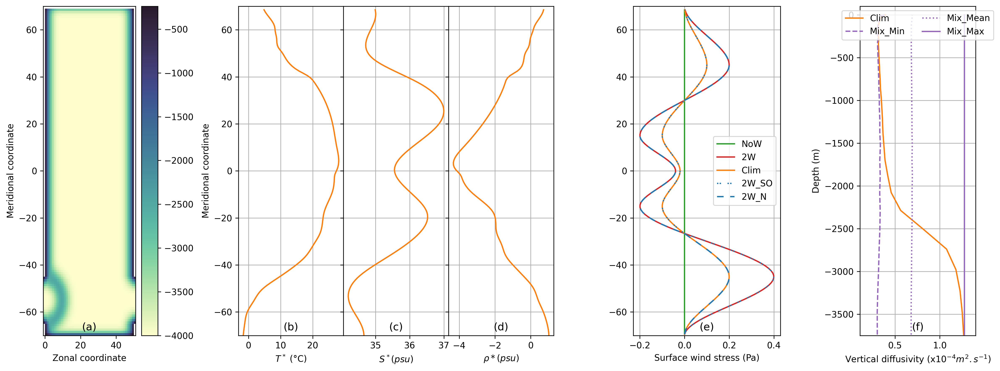

In [7]:
fig = plt.figure(figsize=(16,6), dpi=300)

gs0 = gridspec.GridSpec(1, 4, figure=fig, width_ratios=[1.1, 3., 1.4, 1.1])

ax1 = fig.add_subplot(gs0[0])  

gs00 = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs0[1], wspace=0)
ax2 = fig.add_subplot(gs00[0])
ax3 = fig.add_subplot(gs00[1])
ax4 = fig.add_subplot(gs00[2])

ax5 = fig.add_subplot(gs0[2])
ax6 = fig.add_subplot(gs0[3])

for key in ["Clim"] :
    datasets_snap[key].t_star.plot(y='yt', ax=ax2, color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)
    datasets_snap[key].s_star.plot(y='yt', ax=ax3, color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)
    rho_forc = neq2.nonlin2_eq_of_state_rho(datasets_snap[key].s_star, datasets_snap[key].t_star, 0)
    rho_forc.plot(y='yt', ax=ax4, color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)
   
for key in ["NoW", "2W", "Clim","2W_SO", "2W_N"] :
    datasets_snap[key].surface_taux.isel(xu=30).plot(y='yt', ax=ax5, color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)

# BnL = (0.8 + 1.05 / np.pi * np.arctan((-ds_snap.zw - 2500.0) / 222.2))
# BnL.plot(ax=ax6, y='zw', label='Brian and Lewis', color='tab:blue')
for key in ["Clim", "Mix_Min", "Mix_Mean","Mix_Max"] :
    kappa_key = datasets_snap[key].kappaH.isel(Time=0).where(datasets_snap[key].kappaH.isel(Time=0)<1.3e-4).weighted(weight_xyz_w).mean(dim=('xt', 'yt')) *1e4
    kappa_key.plot(ax=ax6, y='zw', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)
ax6.set_xlim(1.1e-1, 1.4)

contour_bath = (-datasets_snap["Clim"].bathymetry).plot(ax=ax1, cmap = cmocean.cm.deep, add_colorbar = True)
contour_bath.colorbar.set_label('')

ax3.set_yticklabels([])  
ax4.set_yticklabels([])  


titles = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']
axs = [ax1, ax2, ax3, ax4, ax5, ax6]
x_labels = [r'Zonal coordinate', r'$T^*$ (°C)', r'$S^* (psu)$', r'$\rho* (psu)$', r'Surface wind stress (Pa)', r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)']
y_labels = ['Meridional coordinate', 'Meridional coordinate', '', '', '', 'Depth (m)']
for i in range(6):
    axs[i].set_title(titles[i], y=0.00)
    axs[i].set_ylim(-70.,70,)
    axs[i].set_ylabel(y_labels[i])
    axs[i].set_xlabel(x_labels[i])
    axs[i].grid()

ax1.grid(False)
ax6.set_ylim(-3750.,100)

ax5.legend()
ax6.legend(ncols=2,loc='upper center')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/Second_exp/"
#plt.savefig(path_to_plot  + f'Setup.png', bbox_inches='tight')
plt.show()


In [8]:
dict_pycnocline_4000={}

for key, ds in datasets_avg.items():
    if key=="pass":
        continue
    ytp = 1500

    z_bottom_mask = ds_snap.zt.where(ds_snap.zt > -4000).min()
    mask_4000 = (ds_snap.zt >= z_bottom_mask) & (((1-land_mask)*ds_snap.zt).min(dim='zt')<= z_bottom_mask)
    #mask_H = (1-land_mask).sel(zt=-H, method='nearest')
    zmean_4000 = temperature.zt.where(mask_4000).weighted(weight_xyz_t).mean(dim=("xt","yt","zt"))
    salinity_pyc = ds["salt"].sel(Time=ytp * 365, method="nearest").where(mask_4000)
    temperature_pyc = ds["temp"].sel(Time=ytp * 365, method="nearest").where(mask_4000)

    #Pycnocline H=4000m, zv=-2000m (env)
    meridional_pic_fab_4000, zonavg_depth_anomaly_approx_4000, zonavg_mean_N2_approx_4000, H_plus_4000, H_thin_4000 = diagf.pycnocline_fab(salinity_pyc, temperature_pyc, -2*zmean_4000, ds_snap.zt, weight_surf, weight_xyz_t, land_mask)
    meridional_pic_gna_4000, zonavg_numer_4000, zonavg_denum_4000  = diagf.pycnocline_gnanadesikan(salinity_pyc, temperature_pyc, -2*zmean_4000, ds_snap.zt, weight_surf, weight_xyz_t, land_mask)
    
    dict_pycnocline_4000[key] = {"pic_fab": meridional_pic_fab_4000,
                            "zonavg_depth_anomaly_approx" : zonavg_depth_anomaly_approx_4000,
                            "zonavg_mean_N2_approx" : zonavg_mean_N2_approx_4000,
                            "H_plus" : H_plus_4000,
                            "H_thin" : H_thin_4000.weighted(weight_surf).mean(dim=("xt",)),
                            "H_thin_map" : H_thin_4000,
                            "pic_gna" : meridional_pic_gna_4000,
                            "zonavg_numer" : zonavg_numer_4000,
                            "zonavg_denum" : zonavg_denum_4000,
                            }



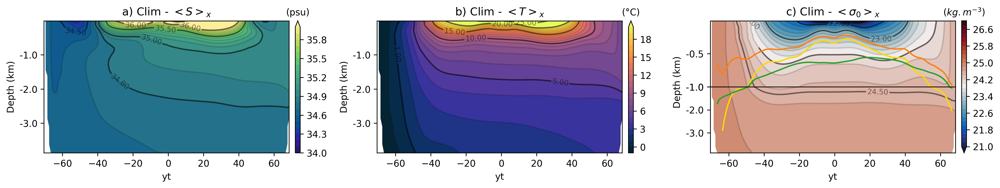

In [16]:
fig = plt.figure(figsize=(18,6.5), dpi=300)
######TOP######
gs = gridspec.GridSpec(2, 1, figure=fig, width_ratios=[1], height_ratios=[1,1], hspace = 0.5)
gs_top = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs[0], width_ratios=[1,1,1], height_ratios=[1], wspace=0.3, hspace = 0.5)
gs_bot = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs[1], width_ratios=[1,1,1], height_ratios=[1], wspace=0.3, hspace = 0.5)

# gs1 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_top[0], width_ratios=[1, 0.02], wspace = 0.05)
# ax1 = fig.add_subplot(gs1[0])
# cax1 = fig.add_subplot(gs1[1])
# ax1_labeled_levels = [34.0, 34.5, 34.8, 35., 35.5, 36.,]
# contour1 = axis_depth_long_two_fields(ax1, "zonal_mean_s", dict_field_zonal_mean_s["NoW"], dict_field_zonal_mean_s["NoW"], span = (34,36), norm='Normalize', levels = 21, labeled_levels = ax1_labeled_levels, cmap = "cmo.haline", neg_pos = False)
# fig.colorbar(contour1, cax=cax1, orientation='vertical')
# #cax_t.set_title(field)

# gs2 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_top[1], width_ratios=[1, 0.02], wspace = 0.05)
# ax2 = fig.add_subplot(gs2[0])
# cax2 = fig.add_subplot(gs2[1])
# contour2 = axis_depth_long_two_fields(ax2, "zonal_mean_t", dict_field_zonal_mean_t["NoW"], dict_field_zonal_mean_t["NoW"], span = (-1, 20), norm='Normalize', levels = 22, labeled_levels = [1., 5., 10., 15., 20., 25., 30.], cmap="cmo.thermal")
# fig.colorbar(contour2, cax=cax2, orientation='vertical')


# gs3 = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=gs_top[2], width_ratios=[1, 0.02], wspace = 0.05, hspace=0)
# ax3_up = fig.add_subplot(gs3[0,0])
# ax3_down = fig.add_subplot(gs3[1,0])
# cax3 = fig.add_subplot(gs3[:,1])
# contour3_up = axis_depth_long_two_fields(ax3_up, "zonal_mean_rho_anomaly", dict_field_zonal_mean_prho["NoW"], dict_field_zonal_mean_prho["NoW"], span = (21,27), norm='Normalize', levels = 31, labeled_levels = [21., 22., 23., 24., 24.5, 25., 26, 27.], cmap="cmo.balance")
# contour3_down = axis_depth_long_two_fields(ax3_down, "zonal_mean_rho_anomaly", dict_field_zonal_mean_prho["NoW"], dict_field_zonal_mean_prho["NoW"], span = (21,27), norm='Normalize', levels = 31, labeled_levels = [21., 22., 23., 24., 24.5, 25., 26, 27.], cmap="cmo.balance")
# fig.colorbar(contour3_up, cax=cax3, orientation='vertical')
# H_thin_contour = dict_pycnocline_4000["NoW"]["H_thin"].sel(yt=slice(None, None)).plot(ax=ax3_up, color='tab:orange', linewidth=1.5, label=r'$H_{thin}$')
# H_gna_contour = (-dict_pycnocline_4000["NoW"]["pic_gna"]).sel(yt=slice(None, None)).plot(ax=ax3_up, color='tab:green', linewidth=1.5, label=r'$H_{gna}$')
# dict_pycnocline_4000["NoW"]["H_thin"].sel(yt=slice(None, None)).plot(ax=ax3_down, color='tab:orange', linewidth=1.5, label=r'$H_{thin}$')
# (-dict_pycnocline_4000["NoW"]["pic_gna"]).sel(yt=slice(None, None)).plot(ax=ax3_down, color='tab:green', linewidth=1.5, label=r'$H_{gna}$')
# ax3_up.set_ylim(-1000,None), ax3_down.set_ylim(None,-1000)

# ax_left=[ax1, ax2, ax3_up, ax3_down]
# titles =[r"a) NoW - $<S>_x$", r"b) NoW - $<T>_x$", r"c) NoW - $<\sigma_0>_x$", ""]
# i=0
# for axis in ax_left :
#     axis.set_yticklabels([f"{(tick/1000):.1f}" for tick in axis.get_yticks()])
#     axis.set_ylabel('Depth (km)')
#     axis.set_title(titles[i])
#     i+=1
# ax3_down.set_ylabel('                          Depth (km)'), ax3_up.set_ylabel('')


# caxis = [cax1, cax2, cax3]
# titles_cax=['(psu)', '(°C)', r'($kg.m^{-3}$)', '(m)', r'($s^{-1}$)']
# i=0
# for cax in caxis : 
#     cax.set_title(titles_cax[i],fontsize=10.)
#     i+=1



######BOTTOM######
gs1 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_bot[0], width_ratios=[1, 0.02], wspace = 0.05)
ax1 = fig.add_subplot(gs1[0])
cax1 = fig.add_subplot(gs1[1])
ax1_labeled_levels = [34.0, 34.5, 34.8, 35., 35.5, 36.,]
contour1 = axis_depth_long_two_fields(ax1, "zonal_mean_s", dict_field_zonal_mean_s["Clim"], dict_field_zonal_mean_s["Clim"], span = (34,36), norm='Normalize', levels = 21, labeled_levels = ax1_labeled_levels, cmap = "cmo.haline", neg_pos = False)
fig.colorbar(contour1, cax=cax1, orientation='vertical')
#cax_t.set_title(field)

gs2 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_bot[1], width_ratios=[1, 0.02], wspace = 0.05)
ax2 = fig.add_subplot(gs2[0])
cax2 = fig.add_subplot(gs2[1])
contour2 = axis_depth_long_two_fields(ax2, "zonal_mean_t", dict_field_zonal_mean_t["Clim"], dict_field_zonal_mean_t["Clim"], span = (-1, 20), norm='Normalize', levels = 22, labeled_levels = [1., 5., 10., 15., 20., 25., 30.], cmap="cmo.thermal")
fig.colorbar(contour2, cax=cax2, orientation='vertical')


gs3 = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=gs_bot[2], width_ratios=[1, 0.02], wspace = 0.05, hspace=0)
ax3_up = fig.add_subplot(gs3[0,0])
ax3_down = fig.add_subplot(gs3[1,0])
cax3 = fig.add_subplot(gs3[:,1])
contour3_up = axis_depth_long_two_fields(ax3_up, "zonal_mean_rho_anomaly", dict_field_zonal_mean_prho["Clim"], dict_field_zonal_mean_prho["Clim"], span = (21,27), norm='Normalize', levels = 31, labeled_levels = [21., 22., 23., 24., 24.5, 25., 26, 27.], cmap="cmo.balance")
contour3_down = axis_depth_long_two_fields(ax3_down, "zonal_mean_rho_anomaly", dict_field_zonal_mean_prho["Clim"], dict_field_zonal_mean_prho["Clim"], span = (21,27), norm='Normalize', levels = 31, labeled_levels = [21., 22., 23., 24., 24.5, 25., 26, 27.], cmap="cmo.balance")
fig.colorbar(contour3_up, cax=cax3, orientation='vertical')
H_plus_contour = (-dict_pycnocline_4000["Clim"]["H_plus"]).sel(yt=slice(-64, None)).plot(ax=ax3_up, color='gold', linewidth=1.5, label=r'$H_{pyc}$')
H_thin_contour = dict_pycnocline_4000["Clim"]["H_thin"].sel(yt=slice(None, None)).plot(ax=ax3_up, color='tab:orange', linewidth=1.5, label=r'$H_{thin}$')
H_gna_contour = (-dict_pycnocline_4000["Clim"]["pic_gna"]).sel(yt=slice(None, None)).plot(ax=ax3_up, color='tab:green', linewidth=1.5, label=r'$H_{gna}$')
dict_pycnocline_4000["Clim"]["H_thin"].sel(yt=slice(None, None)).plot(ax=ax3_down, color='tab:orange', linewidth=1.5)
(-dict_pycnocline_4000["Clim"]["H_plus"]).sel(yt=slice(-64, None)).plot(ax=ax3_down, color='gold', linewidth=1.5)
(-dict_pycnocline_4000["Clim"]["pic_gna"]).sel(yt=slice(None, None)).plot(ax=ax3_down, color='tab:green', linewidth=1.5)
ax3_up.set_ylim(-1000,None), ax3_down.set_ylim(None,-1000)

ax_left=[ax1, ax2, ax3_up, ax3_down]
titles =[r"a) Clim - $<S>_x$", r"b) Clim - $<T>_x$", r"c) Clim - $<\sigma_0>_x$", ""]
i=0
for axis in ax_left :
    axis.set_yticklabels([f"{(tick/1000):.1f}" for tick in axis.get_yticks()])
    axis.set_ylabel('Depth (km)')
    axis.set_title(titles[i])
    i+=1
ax3_down.set_ylabel('                          Depth (km)'), ax3_up.set_ylabel('')
# ax3_up.legend(loc='lower right', bbox_to_anchor=(0.05, 1.01))

caxis = [cax1, cax2, cax3]
titles_cax=['(psu)', '(°C)', r'($kg.m^{-3}$)', '(m)', r'($s^{-1}$)']
i=0
for cax in caxis : 
    cax.set_title(titles_cax[i],fontsize=10.)
    i+=1


plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
plt.savefig(path_to_plot + f'Clim_1000y_TSprho.png', bbox_inches='tight')

plt.show()

In [10]:
dict_field_moc = {}
dict_field_eddies = {}
dict_field_rmoc = {}
dict_field_ssh = {}

ytp = 1500.
for key, ds in datasets_ovr.items():
    if key=="pass":
        continue    
    dict_field_moc[key] = -(ds.vsf_depth * 1e-6).mean(dim='Time')#.sel(Time=ytp * 365, method="nearest")
    dict_field_eddies[key] = -(ds.bolus_depth * 1e-6).mean(dim='Time')#.sel(Time=ytp * 365, method="nearest")
    dict_field_rmoc[key] = (dict_field_moc[key] + dict_field_eddies[key])
    #dict_field_ssh[key] = ds.p_hydro_here.sel(Time=ytp * 365, method="nearest").isel(zt=-1) / (neq2.rho0 * neq2.grav)

In [11]:
def plot_rmoc_axis(axis, field, field_color_name, field_lines_name, span, norm='Normalize', levels = 31, labeled_levels = [-5000], wlabels=True, cmap = "cmo.balance", neg_pos = False):
    vmin, vmax = span
    linestyle_neg = 'solid'
    if neg_pos :
        linestyle_neg = 'dashed'
        
    if norm=='Normalize':
        norm = colors.Normalize(vmin=vmin, vmax=vmax)
    elif norm=='TwoSlopeNorm':
        norm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

    contour = field_color_name.plot.contourf(ax=axis, levels=levels, norm=norm, cmap=cmap, add_colorbar=False)
    
    field_color_name.where(field_color_name > 0).plot.contour(ax=axis, norm=norm, levels=levels, colors='k', linestyles='solid', alpha=0.15)
    field_color_name.where(field_color_name <= 0).plot.contour(ax=axis, norm=norm, levels=levels, colors='k', linestyles=linestyle_neg, alpha=0.1)
    
    labeled_contour_lines_neg = field_lines_name.where(field_lines_name.yt <= 1).plot.contour(ax=axis, levels=labeled_levels, colors='k', linestyles='solid', alpha=0.7)
    labeled_contour_lines_pos = field_lines_name.where(field_lines_name.yt >= 0).plot.contour(ax=axis, levels=labeled_levels, colors='k', linestyles='solid', alpha=0.7)
    axis.clabel(labeled_contour_lines_pos, levels=labeled_levels, fmt="%.2f", inline=True, fontsize=8, colors="black")
    #axis.set_title(field + rf' - {field_color_name.years:.0f}y') 
    #ax.set_xlim(-70,0)

    return contour

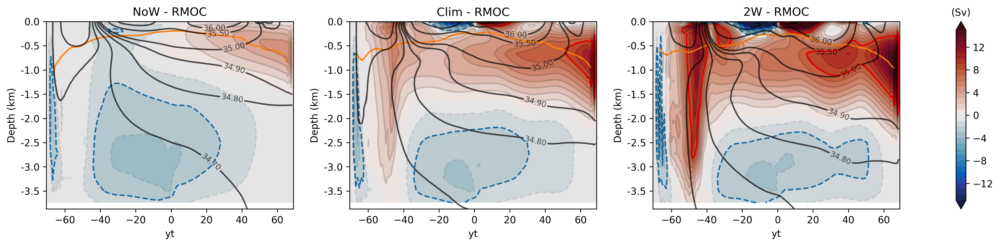

In [13]:
fig = plt.figure(figsize=(17,3.5), dpi=300)
gs = gridspec.GridSpec(1, 1, figure=fig, height_ratios=[1], hspace=0.2)

gs_top = gs[0].subgridspec(1, 4, width_ratios=[1, 1, 1, 0.04],  wspace=0.3, hspace=0.5)
subfield = "_rmoc"

for idx, key in enumerate([ "NoW","Clim", "2W"]):
    if key == "pass" or key=='pass':
        continue
    row, col = divmod(idx, 3)
    gs_row_col = gs_top[row,col].subgridspec(1, 1, height_ratios = [1], hspace=0)
    ax_up = fig.add_subplot(gs_row_col[0])
    # ax_down = fig.add_subplot(gs_row_col[1])
    
    
    labeled_contour_lines_up = dict_field_rmoc[key].plot.contour(ax=ax_up, levels=[8], colors='r', linestyles='solid', alpha=1)
    # labeled_contour_lines_down = dict_field_rmoc[key].plot.contour(ax=ax_down, levels=[8], colors='tab:red', linestyles='solid', alpha=1)

    labeled_contour_lines_up = dict_field_rmoc[key].plot.contour(ax=ax_up, levels=[-2], colors='tab:blue', linestyles='dashed', alpha=1)
    # labeled_contour_lines_down = dict_field_rmoc[key].plot.contour(ax=ax_down, levels=[-2], colors='tab:blue', linestyles='dashed', alpha=1)
    
    H_thin_contour = (dict_pycnocline_4000[key]["H_thin"]).sel(yt=slice(None, 66)).plot(ax=ax_up, color='tab:orange', linewidth=1.5, label=r'$H_{thin}$')

    contour_up = plot_rmoc_axis(ax_up, r"RMOC - " + key, dict_field_rmoc[key], dict_field_zonal_mean_s[key], span = (-15,15),
                                            norm='Normalize', levels = 31, labeled_levels = [34.0, 34.5, 34.6, 34.7, 34.8, 34.9, 35., 35.5, 36.,], wlabels=False, cmap = "cmo.balance", neg_pos = True)
    # contour_down = plot_rmoc_axis(ax_down, r"", dict_field_rmoc[key], dict_field_zonal_mean_s[key], span = (-15,15),
    #                                           norm='Normalize', levels = 31, labeled_levels = [34.0, 34.5, 34.6, 34.7, 34.8, 34.9, 35., 35.5, 36.,], wlabels=False, cmap = "cmo.balance", neg_pos = True)
    

    #axis.clabel(labeled_contour_lines_up, levels=[8], fmt="%.2f", inline=True, fontsize=8, colors="tab:red")
        
    # ax_up.set_ylim(-2000,0)
    # ax_down.set_ylim(None,-2000)
    # ax_up.set_yticks([-1500, -1000, -500,-250,0])
    # ax_down.set_xlabel("")
    ax_up.set_ylabel("")
    # ax_down.set_ylabel("                  Depth (m)")
    # ax_down.set_title('')
    ax_up.set_title(key + " - RMOC")
    ax_up.set_yticklabels([f"{(tick/1000):.1f}" for tick in ax_up.get_yticks()])
    ax_up.set_ylabel('Depth (km)')

cax = fig.add_subplot(gs_top[:,3])  # Span the first two rows for temperature colorbar
fig.colorbar(contour_up, cax=cax, orientation='vertical')
cax.set_title("(Sv)",fontsize=10.)

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
plt.savefig(path_to_plot + f'NoW_Clim_2W_RMOC_salt_1000y.png', bbox_inches='tight')

plt.show()


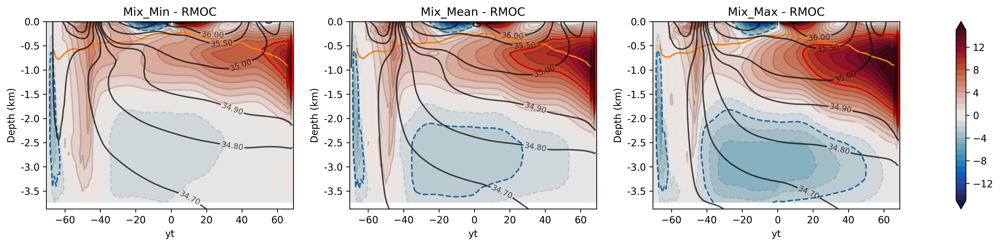

In [17]:
fig = plt.figure(figsize=(17,3.5), dpi=300)
gs = gridspec.GridSpec(1, 1, figure=fig, height_ratios=[1], hspace=0.2)

gs_top = gs[0].subgridspec(1, 4, width_ratios=[1, 1, 1, 0.04],  wspace=0.3, hspace=0.5)
subfield = "_rmoc"

for idx, key in enumerate([ "Mix_Min","Mix_Mean", "Mix_Max"]):
    if key == "pass" or key=='pass':
        continue
    row, col = divmod(idx, 3)
    gs_row_col = gs_top[row,col].subgridspec(1, 1, height_ratios = [1], hspace=0)
    ax_up = fig.add_subplot(gs_row_col[0])
    # ax_down = fig.add_subplot(gs_row_col[1])
    
    
    labeled_contour_lines_up = dict_field_rmoc[key].plot.contour(ax=ax_up, levels=[8], colors='r', linestyles='solid', alpha=1)
    # labeled_contour_lines_down = dict_field_rmoc[key].plot.contour(ax=ax_down, levels=[8], colors='tab:red', linestyles='solid', alpha=1)

    labeled_contour_lines_up = dict_field_rmoc[key].plot.contour(ax=ax_up, levels=[-2], colors='tab:blue', linestyles='dashed', alpha=1)
    # labeled_contour_lines_down = dict_field_rmoc[key].plot.contour(ax=ax_down, levels=[-2], colors='tab:blue', linestyles='dashed', alpha=1)
    
    H_thin_contour = (dict_pycnocline_4000[key]["H_thin"]).sel(yt=slice(None, 66)).plot(ax=ax_up, color='tab:orange', linewidth=1.5, label=r'$H_{thin}$')

    contour_up = plot_rmoc_axis(ax_up, r"RMOC - " + key, dict_field_rmoc[key], dict_field_zonal_mean_s[key], span = (-15,15),
                                            norm='Normalize', levels = 31, labeled_levels = [34.0, 34.4, 34.5, 34.6, 34.7, 34.8, 34.9, 35., 35.5, 36.,], wlabels=False, cmap = "cmo.balance", neg_pos = True)
    # contour_down = plot_rmoc_axis(ax_down, r"", dict_field_rmoc[key], dict_field_zonal_mean_s[key], span = (-15,15),
    #                                           norm='Normalize', levels = 31, labeled_levels = [34.0, 34.5, 34.6, 34.7, 34.8, 34.9, 35., 35.5, 36.,], wlabels=False, cmap = "cmo.balance", neg_pos = True)
    

    #axis.clabel(labeled_contour_lines_up, levels=[8], fmt="%.2f", inline=True, fontsize=8, colors="tab:red")
        
    # ax_up.set_ylim(-2000,0)
    # ax_down.set_ylim(None,-2000)
    # ax_up.set_yticks([-1500, -1000, -500,-250,0])
    # ax_down.set_xlabel("")
    ax_up.set_ylabel("")
    # ax_down.set_ylabel("                  Depth (m)")
    # ax_down.set_title('')
    ax_up.set_title(key + " - RMOC")
    ax_up.set_yticklabels([f"{(tick/1000):.1f}" for tick in ax_up.get_yticks()])
    ax_up.set_ylabel('Depth (km)')
    
cax = fig.add_subplot(gs_top[:,3])  # Span the first two rows for temperature colorbar
fig.colorbar(contour_up, cax=cax, orientation='vertical')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot + f'Mix_RMOC_salt_1000y.png', bbox_inches='tight')

plt.show()


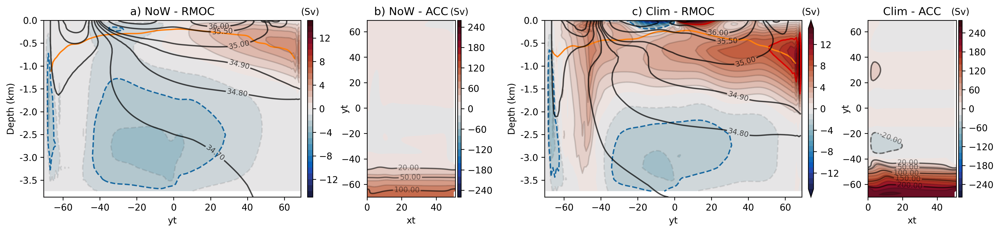

In [18]:
fig = plt.figure(figsize=(18,3.5), dpi=300)
######TOP######
gs = gridspec.GridSpec(1, 2, figure=fig, width_ratios=[1,1], height_ratios=[1], hspace = 0.7)
gs_left = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[0], width_ratios=[1,0.35], height_ratios=[1], wspace=0.3, hspace = 0.6)
gs_right = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[1], width_ratios=[1,0.35], height_ratios=[1], wspace=0.3, hspace = 0.6)

gs1 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_left[0], width_ratios=[1, 0.02], wspace = 0.05)
ax1 = fig.add_subplot(gs1[0])
cax1 = fig.add_subplot(gs1[1])
labeled_contour_lines_up = dict_field_rmoc["NoW"].plot.contour(ax=ax1, levels=[8], colors='r', linestyles='solid', alpha=1)
labeled_contour_lines_up = dict_field_rmoc["NoW"].plot.contour(ax=ax1, levels=[-2], colors='tab:blue', linestyles='dashed', alpha=1)
H_thin_contour = (dict_pycnocline_4000["NoW"]["H_thin"]).sel(yt=slice(None, 66)).plot(ax=ax1, color='tab:orange', linewidth=1.5, label=r'$H_{thin}$')
contour1 = plot_rmoc_axis(ax1, r"RMOC - " + "Clim", dict_field_rmoc["NoW"], dict_field_zonal_mean_s["NoW"], span = (-15,15),
                                        norm='Normalize', levels = 31, labeled_levels = [34.0, 34.4, 34.5, 34.6, 34.7, 34.8, 34.9, 35., 35.5, 36.,], wlabels=False, cmap = "cmo.balance", neg_pos = True)
ax1.set_ylabel("")
ax1.set_yticklabels([f"{(tick/1000):.1f}" for tick in ax1.get_yticks()])
ax1.set_ylabel('Depth (km)')
fig.colorbar(contour1, cax=cax1, orientation='vertical')
#cax_t.set_title(field)

gs2 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_left[1], width_ratios=[1, 0.04], wspace = 0.05)
ax2 = fig.add_subplot(gs2[0])
cax2 = fig.add_subplot(gs2[1])
contour2 = axis_depth_long_two_fields(ax2, r"$\psi_{bar}$ - ", dict_field_bsf["NoW"], dict_field_bsf["NoW"], span = (-250, 250), 
                                        levels = 26, labeled_levels = [-20, 20, 50, 100, 150, 200, 250], cmap="cmo.balance", neg_pos = True)
fig.colorbar(contour2, cax=cax2, orientation='vertical')


gs3 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_right[0], width_ratios=[1, 0.02], wspace = 0.05, hspace=0)
ax3 = fig.add_subplot(gs3[0,0])
cax3 = fig.add_subplot(gs3[:,1])
labeled_contour_lines_up = dict_field_rmoc["Clim"].plot.contour(ax=ax3, levels=[8], colors='r', linestyles='solid', alpha=1)
labeled_contour_lines_up = dict_field_rmoc["Clim"].plot.contour(ax=ax3, levels=[-2], colors='tab:blue', linestyles='dashed', alpha=1)
H_thin_contour = (dict_pycnocline_4000["Clim"]["H_thin"]).sel(yt=slice(None, 66)).plot(ax=ax3, color='tab:orange', linewidth=1.5, label=r'$H_{thin}$')
contour3 = plot_rmoc_axis(ax3, r"RMOC - " + "Clim", dict_field_rmoc["Clim"], dict_field_zonal_mean_s["Clim"], span = (-15,15),
                                        norm='Normalize', levels = 31, labeled_levels = [34.0, 34.4, 34.5, 34.6, 34.7, 34.8, 34.9, 35., 35.5, 36.,], wlabels=False, cmap = "cmo.balance", neg_pos = True)
ax3.set_ylabel("")
ax3.set_yticklabels([f"{(tick/1000):.1f}" for tick in ax3.get_yticks()])
ax3.set_ylabel('Depth (km)')
fig.colorbar(contour3, cax=cax3, orientation='vertical')

gs4 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_right[1], width_ratios=[1, 0.04], wspace = 0.05)
ax4 = fig.add_subplot(gs4[0])
cax4 = fig.add_subplot(gs4[1])
contour4 = axis_depth_long_two_fields(ax4, r"$\psi_{bar}$ - ", dict_field_bsf["Clim"], dict_field_bsf["Clim"], span = (-275, 275), 
                                        levels = 31, labeled_levels = [-20, 20, 50, 100, 150, 200, 250], cmap="cmo.balance", neg_pos = True)
fig.colorbar(contour4, cax=cax4, orientation='vertical')




ax_left=[ax1, ax3]
titles =[r"a) NoW - RMOC", r"b) NoW - ACC", r"c) Clim - RMOC", r"Clim - ACC"]
i=0
for axis in ax_left :
    axis.set_yticklabels([f"{(tick/1000):.1f}" for tick in axis.get_yticks()])
    axis.set_ylabel('Depth (km)')
    axis.set_title(titles[i])
    i+=2

ax_right=[ax2, ax4]
i=1
for axis in ax_right :
    axis.set_ylabel('yt')
    axis.yaxis.set_label_coords(-0.2,0.5)
    axis.set_xlabel('xt')
    axis.set_title(titles[i])
    i+=2

caxis = [cax1, cax2, cax3, cax4]
i=0
for cax in caxis : 
    cax.set_title('(Sv)',fontsize=10.)
    i+=1



plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot + f'NoW_Clim_RMOC_ACC_1000y.png', bbox_inches='tight')

plt.show()

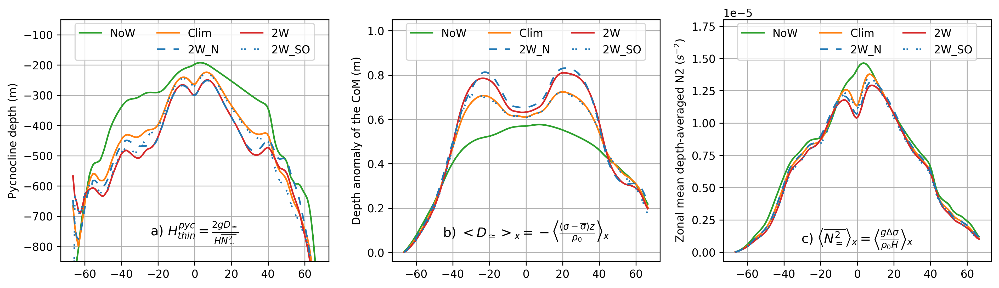

In [19]:
fig = plt.figure(figsize=(17,4), dpi=300)
## BOTTOM
gs_bottom = gridspec.GridSpec(1, 4, figure=fig, width_ratios=[1, 1, 1, 0.15], height_ratios=[1],hspace=0.25, wspace=0.3)

ax1 = fig.add_subplot(gs_bottom[0,0])
ax2 = fig.add_subplot(gs_bottom[0,1])
ax3 = fig.add_subplot(gs_bottom[0,2])

# ax_legend_top = fig.add_subplot(gs_bottom[0,3])  # Empty subplot for the legend
# ax_legend_top.axis("off")  # Hide axes

for idx, key in enumerate(["NoW", "Clim", "2W", "2W_SO", "2W_N"]):
    (dict_pycnocline_4000[key]["H_thin"]).plot(ax=ax1, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)
    dict_pycnocline_4000[key]["zonavg_depth_anomaly_approx"].plot(ax=ax2, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key) 
    dict_pycnocline_4000[key]["zonavg_mean_N2_approx"].plot(ax=ax3, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)

# for idx, key in enumerate(["NoW", "2W", "2W_SO", "2W_N"]):
#     (dict_pycnocline_4000[key]["zonavg_depth_anomaly_approx"]- dict_pycnocline_4000["Clim"]["zonavg_depth_anomaly_approx"]).plot(ax=ax2, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key) 
#     (dict_pycnocline_4000[key]["zonavg_mean_N2_approx"]-dict_pycnocline_4000["Clim"]["zonavg_mean_N2_approx"]).plot(ax=ax3, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)

ax1.text(0, -760, s=r'a) $H_{thin}^{pyc}= \frac{2g D_{\simeq}}{H \overline{N^2_{\simeq}}}$', fontsize=12, ha='center', va='baseline')
ax2.text(0, 0.07, s=r'b) $<D_{\simeq}>_x = - \left<\frac{\overline{(\sigma - \overline{\sigma}) z}}{\rho_0 }\right>_x$', fontsize=12, ha='center', va='baseline')
ax3.text(0, 0.07e-5,s=r'c) $\left<\overline{N^2_{\simeq}}\right>_x = \left<\frac{g \Delta \sigma}{\rho_0 H}\right>_x$', fontsize=12, ha='center', va='baseline')


axs_bottom=[ax1, ax2, ax3,]
titles=['', '', '', '', '', '']
xlabels = ['','','','', '', '']

for idx, axis in enumerate(axs_bottom) :
    axis.set_ylabel(titles[idx])
    axis.set_xlabel(xlabels[idx])
    axis.set_title(xlabels[idx])
    axis.grid()


handles1, labels1 = ax1.get_legend_handles_labels()
# ax_legend_top.legend(handles1, labels1, loc="center", frameon=True)

no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')
handles1, labels1 = [handles1[0], no_mark, handles1[1],  handles1[4], handles1[2], handles1[3]], [labels1[0], "", labels1[1], labels1[4], labels1[2], labels1[3]]

ax1.set_ylim(-850,-50), ax2.set_ylim(None,1.05), ax3.set_ylim(None,1.8e-5)

ax1.legend(handles1, labels1, ncols=3, loc='lower center', bbox_to_anchor=(0.5, 0.81))
ax2.legend(handles1, labels1, ncols=3, loc='lower center', bbox_to_anchor=(0.5, 0.81))
ax3.legend(handles1, labels1, ncols=3, loc='lower center', bbox_to_anchor=(0.5, 0.81))

ax1.set_ylabel('Pycnocline depth (m)'), ax2.set_ylabel('Depth anomaly of the CoM (m)'), ax3.set_ylabel(r'Zonal mean depth-averaged N2 ($s^{-2}$)')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot + f'Winds_tratification_1000y.png', bbox_inches='tight')

plt.show()


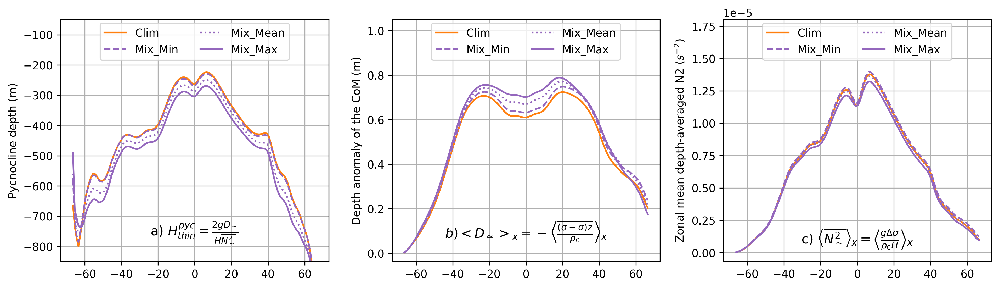

In [20]:
fig = plt.figure(figsize=(17,4), dpi=300)
## BOTTOM
gs_bottom = gridspec.GridSpec(1, 4, figure=fig, width_ratios=[1, 1, 1, 0.15], height_ratios=[1],hspace=0.25, wspace=0.3)

ax1 = fig.add_subplot(gs_bottom[0,0])
ax2 = fig.add_subplot(gs_bottom[0,1])
ax3 = fig.add_subplot(gs_bottom[0,2])

# ax_legend_top = fig.add_subplot(gs_bottom[0,3])  # Empty subplot for the legend
# ax_legend_top.axis("off")  # Hide axes

for idx, key in enumerate(["Clim", "Mix_Min", "Mix_Mean", "Mix_Max"]):
    (dict_pycnocline_4000[key]["H_thin"]).plot(ax=ax1, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)
    dict_pycnocline_4000[key]["zonavg_depth_anomaly_approx"].plot(ax=ax2, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key) 
    dict_pycnocline_4000[key]["zonavg_mean_N2_approx"].plot(ax=ax3, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)

# for idx, key in enumerate(["NoW", "2W", "2W_SO", "2W_N"]):
#     (dict_pycnocline_4000[key]["zonavg_depth_anomaly_approx"]- dict_pycnocline_4000["Clim"]["zonavg_depth_anomaly_approx"]).plot(ax=ax2, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key) 
#     (dict_pycnocline_4000[key]["zonavg_mean_N2_approx"]-dict_pycnocline_4000["Clim"]["zonavg_mean_N2_approx"]).plot(ax=ax3, x='yt', color = style[key]["color"], linestyle = style[key]["linestyle"] , label=key)

ax1.text(0, -760, s=r'a) $H_{thin}^{pyc}= \frac{2g D_{\simeq}}{H \overline{N^2_{\simeq}}}$', fontsize=12, ha='center', va='baseline')
ax2.text(0, 0.07, s=r'$b) <D_{\simeq}>_x = - \left<\frac{\overline{(\sigma - \overline{\sigma}) z}}{\rho_0 }\right>_x$', fontsize=12, ha='center', va='baseline')
ax3.text(0, 0.07e-5,s=r'c) $\left<\overline{N^2_{\simeq}}\right>_x = \left<\frac{g \Delta \sigma}{\rho_0 H}\right>_x$', fontsize=12, ha='center', va='baseline')


axs_bottom=[ax1, ax2, ax3,]
titles=['', '', '', '', '', '']
xlabels = ['','','','', '', '']

for idx, axis in enumerate(axs_bottom) :
    axis.set_ylabel(titles[idx])
    axis.set_xlabel(xlabels[idx])
    axis.set_title(xlabels[idx])
    axis.grid()


handles1, labels1 = ax1.get_legend_handles_labels()
# ax_legend_top.legend(handles1, labels1, loc="center", frameon=True)

no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')
handles1, labels1 = [handles1[0], handles1[1],  handles1[2], handles1[3]], [labels1[0], labels1[1], labels1[2], labels1[3]]

ax1.set_ylim(-850,-50), ax2.set_ylim(None,1.05), ax3.set_ylim(None,1.8e-5)

ax1.legend(handles1, labels1, ncols=2, loc='lower center', bbox_to_anchor=(0.5, 0.81))
ax2.legend(handles1, labels1, ncols=2, loc='lower center', bbox_to_anchor=(0.5, 0.81))
ax3.legend(handles1, labels1, ncols=2, loc='lower center', bbox_to_anchor=(0.5, 0.81))

ax1.set_ylabel('Pycnocline depth (m)'), ax2.set_ylabel('Depth anomaly of the CoM (m)'), ax3.set_ylabel(r'Zonal mean depth-averaged N2 ($s^{-2}$)')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot + f'Mix_tratification_1000y.png', bbox_inches='tight')

plt.show()


In [21]:
tw = {"NoW": 0, "2W_SO": 2 * 0.2, "2W_N": 1 * 0.2, "2W": 2 * 0.2, 
      "Clim": 1 * 0.2, "Mix_Min": 1 * 0.2, "Mix_Mean": 1 * 0.2, "Mix_Max": 1. * 0.2}
kappaH = {"Mix_Min": 0.3 * 1e-4, "Mix_Mean": .68 * 1e-4, "Mix_Max": 1.26 * 1e-4,
          "Clim": 0.3 * 1e-4, "NoW": 0.3 * 1e-4, "2W_SO": 0.3 * 1e-4, "2W_N": 0.3 * 1e-4, "2W": 0.3 * 1e-4}
space = {"Clim": '    ', "NoW" : '     ',   "Futur" : '   ',
         "2W_SO": '   ',        "2W" : '      ',      "2W_N": '    ',  
         "Mix_Min": ' ', "Mix_Mean" : '', "Mix_Max" : ' ', 
          }

In [22]:
dict_RMOC_cells = {}
for idx, key in enumerate(keys_to_plot):
    if key == "pass":
        continue

    ds_rmoc = dict_field_rmoc[key]
    cell_NA_rmoc = ds_rmoc.where((ds_rmoc.yu>35) & (ds_rmoc.zw>-2000)).max()
    cell_40S_60S_rmoc = ds_rmoc.where((ds_rmoc.yu>-60) & (ds_rmoc.yu<-40)).max()
    cell_bottom_rmoc = ds_rmoc.where((ds_rmoc.yu>-40) & (ds_rmoc.zw<-2000)).min()

    ds_moc = dict_field_moc[key]
    cell_NA_moc = ds_moc.where((ds_moc.yu>35) & (ds_moc.zw>-2000)).max()
    cell_40S_60S_moc = ds_moc.where((ds_moc.yu>-60) & (ds_moc.yu<-40)).max()
    cell_bottom_moc = ds_moc.where((ds_moc.yu>-40) & (ds_moc.zw<-2000)).min()
    
    ds_eddies = dict_field_eddies[key]
    cell_NA_eddies = ds_eddies.where((ds_eddies.yu>35) & (ds_eddies.zw>-2000)).max()
    cell_40S_60S_eddies = ds_eddies.where((ds_eddies.yu>-60) & (ds_eddies.yu<-40)).min()
    cell_bottom_eddies = ds_eddies.where((ds_eddies.yu>-40) & (ds_eddies.zw<-2000)).min()

    dict_RMOC_cells[key] = {"cell_NA_rmoc" : cell_NA_rmoc,
                            "cell_40S_60S_rmoc" : cell_40S_60S_rmoc,
                            "bottom_cell_rmoc" : cell_bottom_rmoc,

                            "cell_NA_moc" : cell_NA_moc,
                            "cell_40S_60S_moc" : cell_40S_60S_moc,
                            "bottom_cell_moc" : cell_bottom_moc,

                            "cell_NA_eddies" : cell_NA_eddies,
                            "cell_40S_60S_eddies" : cell_40S_60S_eddies,
                            "bottom_cell_eddies" : cell_bottom_eddies,
                            }


dict_ACC = {}
for idx, key in enumerate(keys_to_plot):
    if key == "pass":
        continue

    trans_ACC = dict_field_bsf[key].where(dict_field_bsf[key].yu<-40).max()
    dict_ACC[key] = trans_ACC


In [23]:
Glob_H_thin = {}
Glob_H_gna = {}
for key in keys_to_plot:
    ds = dict_pycnocline_4000[key]["H_thin_map"]
    ds_gna = dict_pycnocline_4000[key]["pic_gna"]
    Glob_H_thin[key] = ds.where((ds.yt<40) & (ds.yt>-40)).weighted(weight_xyz_t).mean(dim=("xt", "yt", "zt"))
    Glob_H_gna[key] = -ds_gna.where((ds_gna.yt<40) & (ds_gna.yt>-40)).weighted(weight_xyz_t).mean(dim=("xt", "yt", "zt"))

    print(Glob_H_thin[key].values, Glob_H_gna[key].values)

-338.20413764675055 -636.071112261495
-260.4954605433475 -522.0639886011655
-447.24424565495065 -793.6225158803468
-351.11349864391343 -644.9418764071264
-381.30632026677154 -646.6175584243022
-374.62638887958275 -639.3500245422389
-342.73167851502234 -729.2165239067759
-362.3044853111725 -733.650853466255
-381.6563354889241 -746.2727591414317


In [24]:
g = 9.81
rho_0 = 1024.
degtorad = np.pi / 180.0

Lx = 6370e3 * 50 * degtorad # Zonal Channel extent
Lc = 6370e3 * 20 * degtorad # Meridionnal Channel extent
Ly = 6370e3 * 80 * degtorad # Zonal Bassin extent

# omega = np.pi / 43082.0
# f = 2 * omega * np.sin(45 * degtorad) 
# print(rf'f = {f:e} /s')
f=1e-4

A = 50 * degtorad * (np.sin(70 * degtorad) + np.sin(70 * degtorad)) * (6370e3) ** 2 
print(rf'A = {A:e} m^2')
#A =2.44e14

print(Lx * Ly / A)

K_GM = 1000. ## Arbitrary, to be modified/choose carefully

A = 6.654908e+13 m^2
0.7429362382497502


In [25]:
print(Lx, Lc, Ly)

5558873.667601939 2223549.467040776 8894197.868163103


In [26]:
# Physical constants
delta_rho = 2.2

# Parameter ranges
tau_values = np.linspace(0, 2, 21) * 0.2
K_GM_values = np.linspace(0, 3000, 31) 
kappa_H_values = np.linspace(3, 15, 241) * 1e-5

# Empty 3D arrays for D and psi
D_solved_array = np.full((len(tau_values), len(K_GM_values), len(kappa_H_values)), np.nan)
psi_solved_array = np.full_like(D_solved_array, np.nan)

# Loop through parameter combinations
for i, tau in enumerate(tau_values):
    for j, K_GM in enumerate(K_GM_values):
        for k, kappa_H in enumerate(kappa_H_values):
            delta_buoy = g * delta_rho / rho_0 

            a = delta_buoy / f
            b = K_GM * Lx / Lc
            c = -tau * Lx / (rho_0 * f)
            d = -kappa_H * Lx * Ly
            
            roots = np.roots([a, b, c, d])
            real_roots = [r.real for r in roots if np.isreal(r) and r.real > 0]
            
            if real_roots:
                D_solved = -real_roots[0]
                D_solved_array[i, j, k] = D_solved
                #psi_solved = (tau * Lx / (rho_0 * f) - K_GM * Lx * D_solved / Lc ) * 1e-6
                psi_solved = D_solved**2 * delta_buoy / f * 1e-6
                psi_solved_array[i, j, k] = psi_solved

# Wrap in xarray
D_xr = xr.DataArray(D_solved_array, coords={'tau': tau_values,'K_GM': K_GM_values,'kappa_H': kappa_H_values}, dims=['tau', 'K_GM', 'kappa_H'],)

psi_xr = xr.DataArray(psi_solved_array, coords={'tau': tau_values,'K_GM': K_GM_values,'kappa_H': kappa_H_values}, dims=['tau', 'K_GM', 'kappa_H'],)


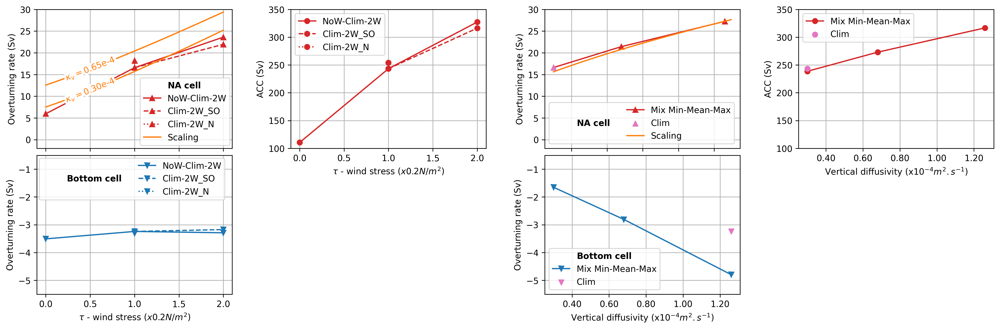

In [27]:
fig = plt.figure(figsize=(20,6), dpi=300)
gs_bottom = gridspec.GridSpec(2, 4, figure=fig, height_ratios=[1,1], width_ratios=[1,1,1,1], hspace=0.05, wspace=0.3)

## BOTTOM
ax1_top = fig.add_subplot(gs_bottom[0,0])
ax1_bot = fig.add_subplot(gs_bottom[1,0])
ax2     = fig.add_subplot(gs_bottom[0,1])
ax3_top = fig.add_subplot(gs_bottom[0,2])
ax3_bot = fig.add_subplot(gs_bottom[1,2])
ax4 = fig.add_subplot(gs_bottom[0,3])

key_Wind = ["NoW","Clim", "2W"]
key_Clim_2W_SO = ["Clim", "2W_SO"]
key_Clim_2W_N = ["Clim", "2W_N"]

### WIND PLOTS 
## RMOC cells
ax1_top.plot(np.array([tw[k] for k in key_Wind]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Wind]), marker='^', color='tab:red', linestyle='solid', label = "NoW-Clim-2W")
ax1_top.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Clim_2W_SO]), marker='^', color='tab:red', linestyle='dashed', label = "Clim-2W_SO")
ax1_top.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Clim_2W_N]), marker='^', color='tab:red', linestyle='dotted', label = "Clim-2W_N")

ax1_bot.plot(np.array([tw[k] for k in key_Wind]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Wind]), marker='v', color='tab:blue', linestyle='solid', label = "NoW-Clim-2W")
ax1_bot.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Clim_2W_SO]), marker='v', color='tab:blue', linestyle='dashed', label = "Clim-2W_SO")
ax1_bot.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Clim_2W_N]), marker='v', color='tab:blue', linestyle='dotted', label =  "Clim-2W_N")

#Global mean H_thin
ax2.plot(np.array([tw[k] for k in key_Wind]), np.array([dict_ACC[k] for k in key_Wind]), marker='o', color='tab:red', linestyle='solid', label = "NoW-Clim-2W")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([dict_ACC[k] for k in key_Clim_2W_SO]), marker='o', color='tab:red', linestyle='dashed', label = "Clim-2W_SO")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([dict_ACC[k] for k in key_Clim_2W_N]), marker='o', color='tab:red', linestyle='dotted', label =  "Clim-2W_N")


# key_all_Wind = ["Clim", "NoW", "2W_SO", "2W_N", "2W"]
# ax2.scatter(np.array([tw[k] for k in key_all_Wind]), np.array([D_scale[k]["D_solved"] for k in key_all_Wind]), marker='x', color='tab:orange', label = "D scaling")

psi_xr.sel(K_GM=1000.).sel(kappa_H = 0.305 * 1e-4, method='nearest').plot(ax=ax1_top, x='tau', color='tab:orange', label=rf'$\kappa_v=${0.305:.2f}e-4')
psi_xr.sel(K_GM=1000.).sel(kappa_H = 0.65 * 1e-4, method='nearest').plot(ax=ax1_top, x='tau', color='tab:orange', label=rf'$\kappa_v=${0.65:.2f}e-4')

labelLines(ax2.get_lines()[3:], align=True, xvals=[0.1, 0.1, 0.1])
labelLines(ax1_top.get_lines()[3:], align=True, xvals=[0.1, 0.1])

handles_ax1_top, labels_ax1_top = ax1_top.get_legend_handles_labels()
handles_ax1_bot, labels_ax1_bot = ax1_bot.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()

no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')

# handles_ax1_top = [no_mark, no_mark, no_mark, handles_ax1_top[0], handles_ax1_top[1], handles_ax1_top[2]]
# labels_ax1_top =  ["", r"$\bf{NA ~ cell}$", "", labels_ax1_top[0] , labels_ax1_top[1], labels_ax1_top[2]]

handles_ax1_top = [no_mark, handles_ax1_top[0], handles_ax1_top[1], handles_ax1_top[2], handles_ax1_top[3]]
labels_ax1_top =  [r"$\bf{NA ~ cell}$", labels_ax1_top[0] , labels_ax1_top[1], labels_ax1_top[2], "Scaling"]

handles_ax1_bot = [no_mark, no_mark, no_mark, handles_ax1_bot[0], handles_ax1_bot[1], handles_ax1_bot[2]]
labels_ax1_bot =  ["", r"$\bf{Bottom ~ cell}$", "", labels_ax1_bot[0], labels_ax1_bot[1], labels_ax1_bot[2]]



### DIFUSIVITY PLOTS

key_Mix = ["Mix_Min", "Mix_Mean", "Mix_Max"]

## RMOC cells
ax3_top.plot(np.array([kappaH[k] for k in key_Mix]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Mix]), marker='^', color='tab:red', label = "Mix Min-Mean-Max", zorder=2)
ax3_top.scatter(np.array(kappaH["Mix_Min"]), np.array(dict_RMOC_cells["Clim"]["cell_NA_rmoc"]), marker='^', color='tab:pink', label = "Clim", zorder=3)

ax3_bot.plot(np.array([kappaH[k] for k in key_Mix]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Mix]), marker='v', color='tab:blue', label = "Mix Min-Mean-Max", zorder=2)
ax3_bot.scatter(np.array(kappaH["Mix_Max"]), np.array(dict_RMOC_cells["Clim"]["bottom_cell_rmoc"]), marker='v', color='tab:pink', label = "Clim", zorder=3)

## Global mean H_thin
ax4.plot(np.array([kappaH[k] for k in key_Mix]), np.array([dict_ACC[k] for k in key_Mix]), marker='o', color='tab:red', linestyle='solid', label = "Mix Min-Mean-Max", zorder=2)
ax4.scatter(np.array(kappaH["Mix_Min"]), np.array(dict_ACC["Clim"]), marker='o', color='tab:pink', label = "Clim", zorder=3)

# key_all_Mix = ["Clim", "Mix_Min", "Mix_Mean", "Mix_Max"]
# ax4.scatter(np.array([kappaH[k] for k in key_all_Mix]), np.array([D_scale[k]["D_solved"] for k in key_all_Mix]), marker='x', color='tab:orange', label = "D scaling", zorder=3)

psi_xr.sel(K_GM=1000.).sel(tau =0.2, method='nearest').where(psi_xr.kappa_H<1.3 *1e-4).plot(ax=ax3_top, x='kappa_H', color='tab:orange', label=rf'Scaling')

handles_ax3_top, labels_ax3_top = ax3_top.get_legend_handles_labels()
handles_ax3_bot, labels_ax3_bot = ax3_bot.get_legend_handles_labels()

no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')

handles_ax3_top = [no_mark, no_mark, no_mark, handles_ax3_top[0], handles_ax3_top[1], handles_ax3_top[2]]
labels_ax3_top =  ["", r"$\bf{NA ~ cell}$", "", labels_ax3_top[0], labels_ax3_top[1], labels_ax3_top[2]]

handles_ax3_bot = [no_mark, handles_ax3_bot[0], handles_ax3_bot[1]]
labels_ax3_bot =  [r"$\bf{Bottom ~ cell}$", labels_ax3_bot[0], labels_ax3_bot[1]]


axs_bottom=[ax1_top,ax1_bot, ax2, ax3_top,ax3_bot, ax4]
xlabels=["",r'$\tau$ - wind stress $(x 0.2 N/m^2)$', r'$\tau$ - wind stress $(x 0.2 N/m^2)$', "",r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)', r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)']
titles= ["Overturning rate (Sv)", "Overturning rate (Sv)", "ACC (Sv)", "Overturning rate (Sv)", "Overturning rate (Sv)",  "ACC (Sv)"]
for idx, axis in enumerate(axs_bottom) :
    axis.set_ylabel(titles[idx])
    axis.set_xlabel(xlabels[idx])
    axis.grid()
    axis.set_title('')

ax1_top.set_ylim(-2,30), ax3_top.set_ylim(-2,30)
ax1_top.legend(handles_ax1_top, labels_ax1_top, ncols=1, loc='lower right', bbox_to_anchor=(1.01, -0.01))
ax3_top.legend(handles_ax3_top, labels_ax3_top, ncols=2, loc='lower left', bbox_to_anchor=(0.001, .001))

ax1_bot.set_ylim(-5.5,-0.5), ax3_bot.set_ylim(-5.5,-0.5)
ax1_bot.legend(handles_ax1_bot, labels_ax1_bot, ncols=2, loc='upper left', bbox_to_anchor=(-0.01, 1.01))
ax3_bot.legend(handles_ax3_bot, labels_ax3_bot, ncols=1, loc='lower left', bbox_to_anchor=(0.001, .001))

ax1_top.set_xticklabels([]), ax3_top.set_xticklabels([])

#ax2.set_ylim(-500,-350)
ax2.legend(handles_ax2, labels_ax2), ax4.legend(loc='upper left')

ax1_bot.set_xticklabels([f"{tick/0.2:.1f}" for tick in ax1_bot.get_xticks()])  
ax2.set_xticklabels([f"{tick/0.2:.1f}" for tick in ax2.get_xticks()])  

ax2.set_ylim(100,350), ax4.set_ylim(100,350)

ax3_bot.set_xticklabels([f"{tick*10000:.2f}" for tick in ax3_bot.get_xticks()])
ax4.set_xticklabels([f"{tick*10000:.2f}" for tick in ax4.get_xticks()])  

# ax3.set_ylim(-4.,-0.9), ax4.set_ylim(-4.,-0.9)
plt.show()


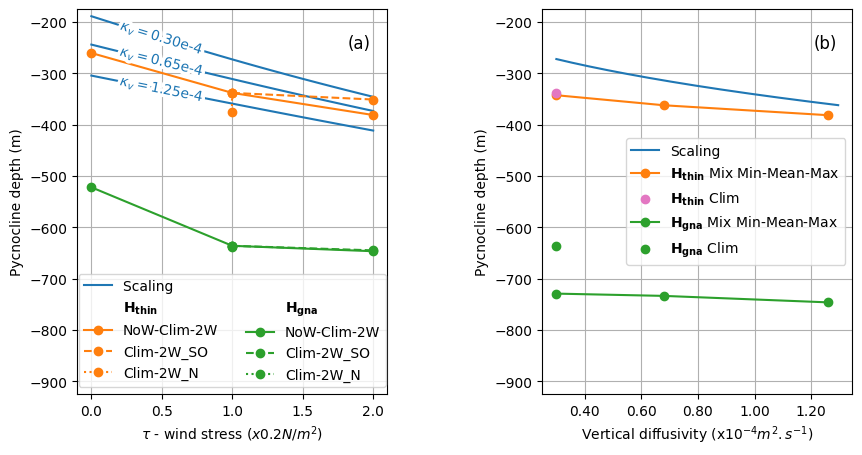

In [28]:
fig = plt.figure(figsize=(10,5.))
gs_bottom = gridspec.GridSpec(1, 2, figure=fig, height_ratios=[1], width_ratios=[1,1], hspace=0.05, wspace=0.5)

## BOTTOM

ax2     = fig.add_subplot(gs_bottom[0])
ax4 = fig.add_subplot(gs_bottom[1])

key_Wind = ["NoW","Clim", "2W"]
key_Clim_2W_SO = ["Clim", "2W_SO"]
key_Clim_2W_N = ["Clim", "2W_N"]

### WIND PLOTS 
#Scaling
for k_H in [0.305, 0.65, 1.25]:
    D_xr.sel(K_GM=1000.).sel(kappa_H = k_H * 1e-4, method='nearest').plot(ax=ax2, x='tau', color='tab:blue', label=rf'$\kappa_v=${k_H:.2f}e-4')
labelLines(ax2.get_lines()[:3], align=True, xvals=[0.1, 0.1, 0.1])

#Global mean H_thin
ax2.plot(np.array([tw[k] for k in key_Wind]), np.array([Glob_H_thin[k] for k in key_Wind]), marker='o', color='tab:orange', linestyle='solid', label = "NoW-Clim-2W")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([Glob_H_thin[k] for k in key_Clim_2W_SO]), marker='o', color='tab:orange', linestyle='dashed', label = "Clim-2W_SO")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([Glob_H_thin[k] for k in key_Clim_2W_N]), marker='o', color='tab:orange', linestyle='dotted', label =  "Clim-2W_N")

#Global mean H_thin
ax2.plot(np.array([tw[k] for k in key_Wind]), np.array([Glob_H_gna[k] for k in key_Wind]), marker='o', color='tab:green', linestyle='solid', label = "NoW-Clim-2W")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([Glob_H_gna[k] for k in key_Clim_2W_SO]), marker='o', color='tab:green', linestyle='dashed', label = "Clim-2W_SO")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([Glob_H_gna[k] for k in key_Clim_2W_N]), marker='o', color='tab:green', linestyle='dotted', label =  "Clim-2W_N")


handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()
no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')
handles_ax2 = [handles_ax2[0], no_mark,          handles_ax2[3], handles_ax2[4], handles_ax2[5], no_mark, no_mark,       handles_ax2[6], handles_ax2[7], handles_ax2[8]]
labels_ax2 =  ["Scaling "    ,r"$\bf{H_{thin}}$", labels_ax2[3],  labels_ax2[4],  labels_ax2[5], "",   r"$\bf{H_{gna}}$", labels_ax2[6],  labels_ax2[7],  labels_ax2[8]]


### DIFUSIVITY PLOTS
key_Mix = ["Mix_Min", "Mix_Mean", "Mix_Max"]

#Scaling
D_xr.sel(K_GM=1000.).sel(tau =0.2, method='nearest').where(D_xr.kappa_H<1.3 *1e-4).plot(ax=ax4, x='kappa_H', color='tab:blue', label=rf'Scaling')

## Global mean H_thin
ax4.plot(np.array([kappaH[k] for k in key_Mix]), np.array([Glob_H_thin[k] for k in key_Mix]), marker='o', color='tab:orange', linestyle='solid', label = "Mix Min-Mean-Max", zorder=2)
ax4.scatter(np.array(kappaH["Mix_Min"]), np.array(Glob_H_thin["Clim"]), marker='o', color='tab:pink', label = "Clim", zorder=3)

## Global mean H_thin
ax4.plot(np.array([kappaH[k] for k in key_Mix]), np.array([Glob_H_gna[k] for k in key_Mix]), marker='o', color='tab:green', linestyle='solid', label = "Mix Min-Mean-Max", zorder=2)
ax4.scatter(np.array(kappaH["Mix_Min"]), np.array(Glob_H_gna["Clim"]), marker='o', color='tab:green', label = "Clim", zorder=3)

handles_ax4, labels_ax4 = ax4.get_legend_handles_labels()
no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')
handles_ax4 = [handles_ax4[0],                    handles_ax4[1],                    handles_ax4[2],                   handles_ax4[3],                   handles_ax4[4]]
labels_ax4 =  [labels_ax4[0] , r"$\bf{H_{thin}}$ "+labels_ax4[1], r"$\bf{H_{thin}}$ "+labels_ax4[2], r"$\bf{H_{gna}}$ "+labels_ax4[3], r"$\bf{H_{gna}}$ "+labels_ax4[4]]


axs_bottom=[ax2, ax4]
xlabels=[r'$\tau$ - wind stress $(x 0.2 N/m^2)$', r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)']
titles= ["Pycnocline depth (m)", "Pycnocline depth (m)"]
for idx, axis in enumerate(axs_bottom) :
    axis.set_ylabel(titles[idx])
    axis.set_xlabel(xlabels[idx])
    axis.grid()
    axis.set_title('')

#ax2.set_ylim(-500,-350)
ax2.legend(handles_ax2, labels_ax2, ncols=2, loc='lower center'), ax4.legend(handles_ax4, labels_ax4, ncols=1, loc='center right',  bbox_to_anchor=(1.,0.5))

ax2.set_xticklabels([f"{tick/0.2:.1f}" for tick in ax2.get_xticks()])  
ax2.set_ylim(-925,-175), ax4.set_ylim(-925,-175)
ax4.set_xticklabels([f"{tick*10000:.2f}" for tick in ax4.get_xticks()])  

ax2.text(1.9*0.2, -250, s=r'(a)', fontsize=12, ha='center', va='baseline')
ax4.text(1.25e-4, -250, s=r'(b)', fontsize=12, ha='center', va='baseline')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot + f'Pycnocline_depths_scaled.png', bbox_inches='tight')

plt.show()

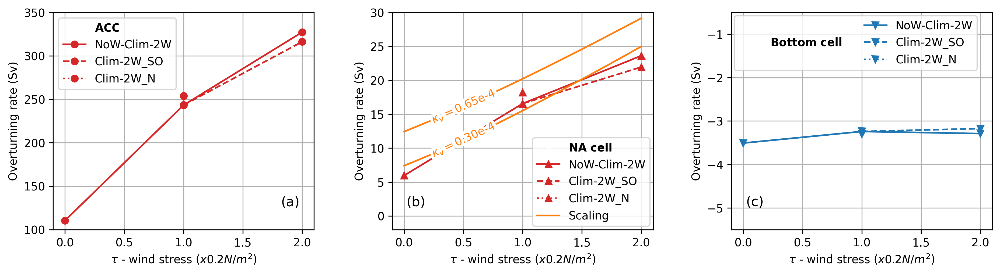

In [29]:
fig = plt.figure(figsize=(15,3.5), dpi=300)
gs_bottom = gridspec.GridSpec(1, 3, figure=fig, height_ratios=[1], width_ratios=[1,1,1], hspace=0.05, wspace=0.3)

## BOTTOM
ax1 = fig.add_subplot(gs_bottom[0])
ax2 = fig.add_subplot(gs_bottom[1])
ax3 = fig.add_subplot(gs_bottom[2])

key_Wind = ["NoW","Clim", "2W"]
key_Clim_2W_SO = ["Clim", "2W_SO"]
key_Clim_2W_N = ["Clim", "2W_N"]

### WIND PLOTS 
## RMOC cells
ax2.plot(np.array([tw[k] for k in key_Wind]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Wind]), marker='^', color='tab:red', linestyle='solid', label = "NoW-Clim-2W")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Clim_2W_SO]), marker='^', color='tab:red', linestyle='dashed', label = "Clim-2W_SO")
ax2.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Clim_2W_N]), marker='^', color='tab:red', linestyle='dotted', label = "Clim-2W_N")

ax3.plot(np.array([tw[k] for k in key_Wind]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Wind]), marker='v', color='tab:blue', linestyle='solid', label = "NoW-Clim-2W")
ax3.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Clim_2W_SO]), marker='v', color='tab:blue', linestyle='dashed', label = "Clim-2W_SO")
ax3.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Clim_2W_N]), marker='v', color='tab:blue', linestyle='dotted', label =  "Clim-2W_N")

#Global mean H_thin
ax1.plot(np.array([tw[k] for k in key_Wind]), np.array([dict_ACC[k] for k in key_Wind]), marker='o', color='tab:red', linestyle='solid', label = "NoW-Clim-2W")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([dict_ACC[k] for k in key_Clim_2W_SO]), marker='o', color='tab:red', linestyle='dashed', label = "Clim-2W_SO")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([dict_ACC[k] for k in key_Clim_2W_N]), marker='o', color='tab:red', linestyle='dotted', label =  "Clim-2W_N")


# key_all_Wind = ["Clim", "NoW", "2W_SO", "2W_N", "2W"]
# ax2.scatter(np.array([tw[k] for k in key_all_Wind]), np.array([D_scale[k]["D_solved"] for k in key_all_Wind]), marker='x', color='tab:orange', label = "D scaling")

psi_xr.sel(K_GM=1300.).sel(kappa_H = 0.305 * 1e-4, method='nearest').plot(ax=ax2, x='tau', color='tab:orange', label=rf'$\kappa_v=${0.305:.2f}e-4')
psi_xr.sel(K_GM=1300.).sel(kappa_H = 0.65 * 1e-4, method='nearest').plot(ax=ax2, x='tau', color='tab:orange', label=rf'$\kappa_v=${0.65:.2f}e-4')

labelLines(ax2.get_lines()[3:], align=True, xvals=[0.1, 0.1])

handles_ax1, labels_ax1 = ax1.get_legend_handles_labels()
handles_ax3, labels_ax3 = ax3.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()

no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')

handles_ax1 = [no_mark, handles_ax1[0], handles_ax1[1], handles_ax1[2]]
labels_ax1 =  [r"$\bf{ACC}$", labels_ax1[0] , labels_ax1[1], labels_ax1[2]]

handles_ax2 = [no_mark, handles_ax2[0], handles_ax2[1], handles_ax2[2], handles_ax2[3]]
labels_ax2 =  [r"$\bf{NA ~ cell}$", labels_ax2[0] , labels_ax2[1], labels_ax2[2], "Scaling"]

handles_ax3 = [no_mark, no_mark, no_mark, handles_ax3[0], handles_ax3[1], handles_ax3[2]]
labels_ax3 =  ["", r"$\bf{Bottom ~ cell}$", "", labels_ax3[0], labels_ax3[1], labels_ax3[2]]



axs_bottom=[ax1, ax2, ax3]
xlabels=[r'$\tau$ - wind stress $(x 0.2 N/m^2)$', r'$\tau$ - wind stress $(x 0.2 N/m^2)$', r'$\tau$ - wind stress $(x 0.2 N/m^2)$']
titles= ["Overturning rate (Sv)","Overturning rate (Sv)", "Overturning rate (Sv)"]
for idx, axis in enumerate(axs_bottom) :
    axis.set_ylabel(titles[idx])
    axis.set_xlabel(xlabels[idx])
    axis.grid()
    axis.set_title('')
    axis.set_xticklabels([f"{tick/0.2:.1f}" for tick in axis.get_xticks()])  


ax2.set_ylim(-2,30)
ax2.legend(handles_ax2, labels_ax2, ncols=1, loc='lower right', bbox_to_anchor=(1.01, -0.01))

ax3.set_ylim(-5.5,-0.5)
ax3.legend(handles_ax3, labels_ax3, ncols=2, loc='upper left', bbox_to_anchor=(-0.01, 1.01))

ax1.set_ylim(100,350)
ax1.legend(handles_ax1, labels_ax1)

ax1.text(1.9*0.2, 127, s=r'(a)', fontsize=12, ha='center', va='baseline')
ax2.text(0.1*0.2, 1.45, s=r'(b)', fontsize=12, ha='center', va='baseline')
ax3.text(0.1*0.2, -4.95, s=r'(c)', fontsize=12, ha='center', va='baseline')


plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot + f'Winds_transport_scaling.png', bbox_inches='tight')

plt.show()


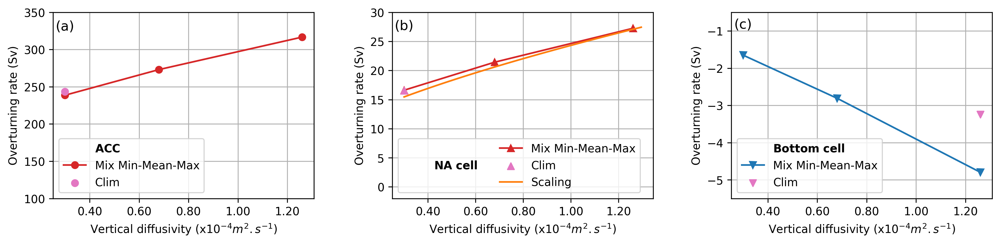

In [30]:
fig = plt.figure(figsize=(15,3), dpi=300)
gs_bottom = gridspec.GridSpec(1, 3, figure=fig, height_ratios=[1], width_ratios=[1,1,1], hspace=0.05, wspace=0.3)

## BOTTOM
ax1 = fig.add_subplot(gs_bottom[0])
ax2 = fig.add_subplot(gs_bottom[1])
ax3 = fig.add_subplot(gs_bottom[2])

### DIFUSIVITY PLOTS
key_Mix = ["Mix_Min", "Mix_Mean", "Mix_Max"]

## RMOC cells
ax2.plot(np.array([kappaH[k] for k in key_Mix]), np.array([dict_RMOC_cells[k]["cell_NA_rmoc"] for k in key_Mix]), marker='^', color='tab:red', label = "Mix Min-Mean-Max", zorder=2)
ax2.scatter(np.array(kappaH["Mix_Min"]), np.array(dict_RMOC_cells["Clim"]["cell_NA_rmoc"]), marker='^', color='tab:pink', label = "Clim", zorder=3)

ax3.plot(np.array([kappaH[k] for k in key_Mix]), np.array([dict_RMOC_cells[k]["bottom_cell_rmoc"] for k in key_Mix]), marker='v', color='tab:blue', label = "Mix Min-Mean-Max", zorder=2)
ax3.scatter(np.array(kappaH["Mix_Max"]), np.array(dict_RMOC_cells["Clim"]["bottom_cell_rmoc"]), marker='v', color='tab:pink', label = "Clim", zorder=3)

## Global mean H_thin
ax1.plot(np.array([kappaH[k] for k in key_Mix]), np.array([dict_ACC[k] for k in key_Mix]), marker='o', color='tab:red', linestyle='solid', label = "Mix Min-Mean-Max", zorder=2)
ax1.scatter(np.array(kappaH["Mix_Min"]), np.array(dict_ACC["Clim"]), marker='o', color='tab:pink', label = "Clim", zorder=3)

# key_all_Mix = ["Clim", "Mix_Min", "Mix_Mean", "Mix_Max"]
# ax1.scatter(np.array([kappaH[k] for k in key_all_Mix]), np.array([D_scale[k]["D_solved"] for k in key_all_Mix]), marker='x', color='tab:orange', label = "D scaling", zorder=3)

psi_xr.sel(K_GM=1300.).sel(tau =0.2, method='nearest').where(psi_xr.kappa_H<1.3 *1e-4).plot(ax=ax2, x='kappa_H', color='tab:orange', label=rf'Scaling')

handles_ax1, labels_ax1 = ax1.get_legend_handles_labels()
handles_ax2, labels_ax2 = ax2.get_legend_handles_labels()
handles_ax3, labels_ax3 = ax3.get_legend_handles_labels()

no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')

handles_ax1 = [no_mark, handles_ax1[0], handles_ax1[1]]
labels_ax1 =  [r"$\bf{ACC}$", labels_ax1[0], labels_ax1[1]]

handles_ax2 = [no_mark, no_mark, no_mark, handles_ax2[0], handles_ax2[1], handles_ax2[2]]
labels_ax2 =  ["", r"$\bf{NA ~ cell}$", "", labels_ax2[0], labels_ax2[1], labels_ax2[2]]

handles_ax3 = [no_mark, handles_ax3[0], handles_ax3[1]]
labels_ax3 =  [r"$\bf{Bottom ~ cell}$", labels_ax3[0], labels_ax3[1]]


axs_bottom=[ax1, ax2, ax3]
xlabels=[r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)', r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)', r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)']
titles= ["Overturning rate (Sv)", "Overturning rate (Sv)", "Overturning rate (Sv)",]
for idx, axis in enumerate(axs_bottom) :
    axis.set_ylabel(titles[idx])
    axis.set_xlabel(xlabels[idx])
    axis.grid()
    axis.set_title('')
    axis.set_xticklabels([f"{tick*10000:.2f}" for tick in axis.get_xticks()])  



ax1.legend(handles_ax1, labels_ax1, ncols=1, loc='lower left', bbox_to_anchor=(0.001, .001))
ax2.legend(handles_ax2, labels_ax2, ncols=2, loc='lower left', bbox_to_anchor=(0.001, .001))
ax3.legend(handles_ax3, labels_ax3, ncols=1, loc='lower left', bbox_to_anchor=(0.001, .001))

ax1.set_ylim(100,350)
ax2.set_ylim(-2,30)
ax3.set_ylim(-5.5,-0.5)

ax1.text(0.3e-4, 326, s=r'(a)', fontsize=12, ha='center', va='baseline')
ax2.text(0.3e-4, 27, s=r'(b)', fontsize=12, ha='center', va='baseline')
ax3.text(0.3e-4, -0.93, s=r'(c)', fontsize=12, ha='center', va='baseline')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot + f'Mixs_transport_scaling.png', bbox_inches='tight')

plt.show()



In [31]:
def plot_axis_i(fig, gs, axis, field, vm=15, title_i ='', sig_lims=(28, 32.5,34)):
    gsi = gs[axis].subgridspec(2, 2, height_ratios=[1, 2], width_ratios = [1,2], wspace=0, hspace=0)
    ax_NW = fig.add_subplot(gsi[0,0])
    ax_NE = fig.add_subplot(gsi[0,1])
    ax_SW = fig.add_subplot(gsi[1,0])
    ax_SE = fig.add_subplot(gsi[1,1])
    cont = field.plot.contourf(ax=ax_NW, y='zt', cmap='cmo.balance', levels=61, vmin=-vm, vmax=vm, add_colorbar=False)
    field.plot.contourf(ax=ax_NE, y='zt', cmap='cmo.balance', levels=61,  vmin=-vm, vmax=vm, add_colorbar=False)
    field.plot.contourf(ax=ax_SE, y='zt', cmap='cmo.balance', levels=61,  vmin=-vm, vmax=vm, add_colorbar=False)
    field.plot.contourf(ax=ax_SW, y='zt', cmap='cmo.balance', levels=61,  vmin=-vm, vmax=vm, add_colorbar=False)
    
    field.plot.contour(ax=ax_NW, y='zt', levels=10, vmin=-vm, vmax=vm, colors='k', linestyles='solid', alpha=0.5)
    field.plot.contour(ax=ax_NE, y='zt', levels=10,  vmin=-vm, vmax=vm, colors='k', linestyles='solid', alpha=0.5)
    field.plot.contour(ax=ax_SE, y='zt', levels=10, vmin=-vm, vmax=vm, colors='k', linestyles='solid', alpha=0.5)
    field.plot.contour(ax=ax_SW, y='zt', levels=10,  vmin=-vm, vmax=vm, colors='k', linestyles='solid', alpha=0.5)
    
    sl_l, sl_c, sl_r = sig_lims
    ax_NW.grid(),            ax_NE.grid(),            ax_SW.grid(),              ax_SE.grid()
    ax_NW.set_title(''),     ax_NE.set_title(''),     ax_SW.set_title(''),       ax_SE.set_title('')
    ax_NW.set_xlim(sl_l,sl_c), ax_NE.set_xlim(sl_c,sl_r), ax_SW.set_xlim(sl_l,sl_c),   ax_SE.set_xlim(sl_c,sl_r)
    ax_NW.set_ylim(-500,0),  ax_NE.set_ylim(-500,0),  ax_SW.set_ylim(None,-500), ax_SE.set_ylim(None,-500)
    ax_NW.set_ylabel(''),    ax_NE.set_ylabel(''),                               ax_SE.set_ylabel('')

    ax_NW.set_xticklabels([]),    ax_NE.set_xticklabels([])
    ax_NE.set_yticklabels([]),    ax_SE.set_yticklabels([])

    ax_NE.set_yticks([0,-125, -250, -375, -500]), ax_NW.set_yticks([0,-125, -250, -375, -500])
    ax_SE.set_xlabel('')
    ax_SW.set_xlabel(r'                       $\sigma_2$ (psu)'), ax_SW.set_ylabel('Depth (m)')
    ax_NW.set_title('                               ' + title_i)
    return cont



In [40]:
## REF and others
Sp1 = np.hstack([np.arange(0, 28, 2),np.arange(28, 32.5, .1),np.arange(32.5, 33.5, .025),np.arange(33.5, 34, .01),35,40])
## Clim and others
Sp2 = np.hstack([np.arange(0, 28, 2),np.arange(28, 32., .05),np.arange(32., 33.1, .025),np.arange(33.1, 34.1, .01), np.arange(34.1, 34.4, .005),35,40])

dSp1 = np.diff(Sp1)
dSp2 = np.diff(Sp2)

dZp1 = ds_snap.dzw.values[np.newaxis, :]
dSp1.shape
space = {"Clim": '    ', "NoW" : '     ',   "Futur" : '   ',
         "2W_SO": '   ',        "2W" : '      ',      "2W_N": '    ',  
         "Mix_Min": ' ', "Mix_Mean" : '', "Mix_Max" : ' ', 
          }


Conv_rate = {}
for key in keys_to_plot : 
    dS = dSp2
    if key=='pass' or key=='Futur':
        continue

    dd_sf_eul = datasets_ovr[key].dd_sf_eul.isel(Time=-1).cumsum('sigma2') * 1e-6
    dd_sf_bolus = datasets_ovr[key].dd_sf_bolus.isel(Time=-1).cumsum('sigma2') * 1e-6
    dd_sf_glob = dd_sf_eul + dd_sf_bolus

    C_euler =  9.81 * np.sum(dd_sf_eul.transpose('sigma2', 'zt') * 1e6 * dS[:, np.newaxis] * dZp1)
    C_bolus =  9.81 * np.sum(dd_sf_bolus.transpose('sigma2', 'zt') * 1e6 * dS[:, np.newaxis] * dZp1)
    C_resid =  9.81 * np.sum(dd_sf_glob.transpose('sigma2', 'zt') * 1e6 * dS[:, np.newaxis] * dZp1)
    Conv_rate[key] = {"C_euler" : C_euler.values * 1e-9, "C_bolus" : C_bolus.values * 1e-9, "C_resid" : C_resid.values * 1e-9}

    print(key + space[key] + rf':   C_euler = {C_euler.values * 1e-9:.2e},    C_bolus = {C_bolus.values * 1e-9:.2e},    C_resid = {C_resid.values * 1e-9:.2e}')

Clim    :   C_euler = -1.41e+02,    C_bolus = 4.10e+01,    C_resid = -9.99e+01
NoW     :   C_euler = 9.01e+00,    C_bolus = 7.85e+00,    C_resid = 1.69e+01
2W_SO   :   C_euler = -2.56e+02,    C_bolus = 6.84e+01,    C_resid = -1.88e+02
2W      :   C_euler = -3.72e+02,    C_bolus = 1.01e+02,    C_resid = -2.71e+02
2W_N    :   C_euler = -2.51e+02,    C_bolus = 7.19e+01,    C_resid = -1.80e+02
Mix_Min :   C_euler = -1.43e+02,    C_bolus = 4.08e+01,    C_resid = -1.02e+02
Mix_Mean:   C_euler = -1.32e+02,    C_bolus = 4.96e+01,    C_resid = -8.22e+01
Mix_Max :   C_euler = -1.15e+02,    C_bolus = 6.67e+01,    C_resid = -4.83e+01


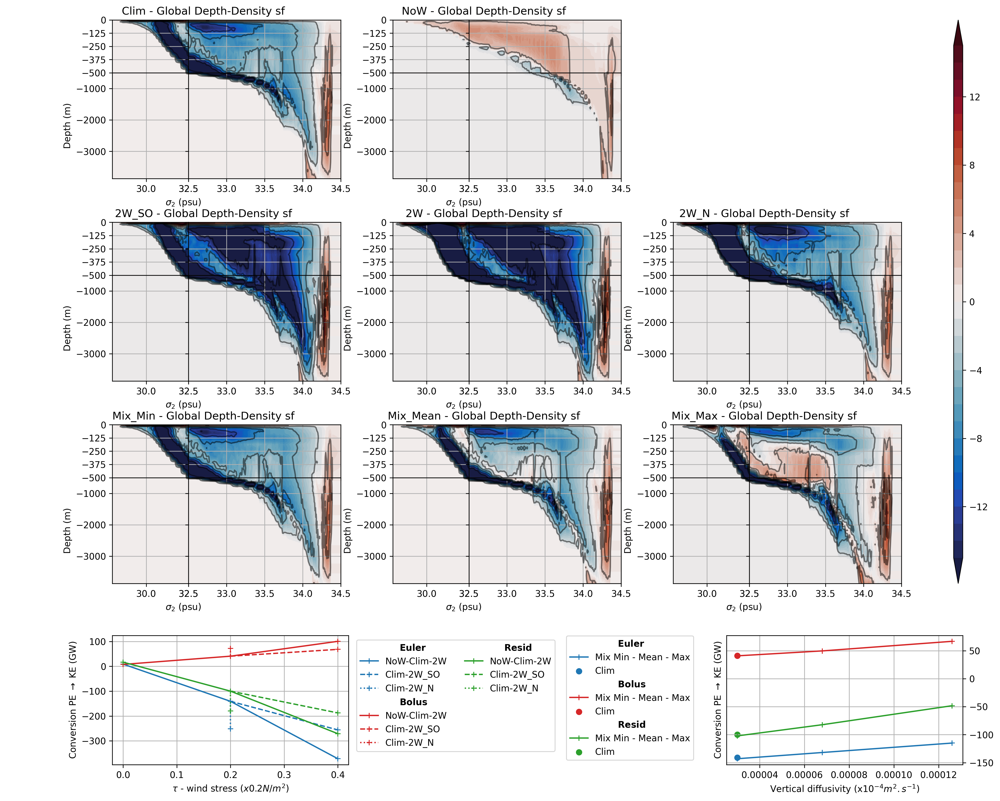

In [41]:
fig = plt.figure(figsize=(17,15), dpi=300)
gs = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[12,2.75], hspace=0.15)

gs_top = gs[0,:].subgridspec(3, 4, width_ratios=[1, 1, 1, 0.04],  wspace=0.3, hspace=0.275)
gs_bottom = gs[1,:].subgridspec(1, 3, width_ratios=[1, 1, 1],  wspace=0.3)

for idx, key in enumerate(keys_to_plot):
    if key == "pass" or key=='Futur':
        continue
    row, col = divmod(idx, 3)
    row, col = divmod(idx, 3)
    sig_limits = (28, 32.5,34.5)

    dd_sf_eul = datasets_ovr[key].dd_sf_eul.isel(Time=-1).cumsum('sigma2') * 1e-6
    dd_sf_bolus = datasets_ovr[key].dd_sf_bolus.isel(Time=-1).cumsum('sigma2') * 1e-6
    dd_sf_glob = dd_sf_eul + dd_sf_bolus

    contour = plot_axis_i(fig, gs_top, (row,col), dd_sf_glob, vm=8, title_i= key + ' - Global Depth-Density sf', sig_lims=sig_limits)



## BOTTOM
ax1 = fig.add_subplot(gs_bottom[0])
ax2 = fig.add_subplot(gs_bottom[2])

key_Wind = ["NoW","Clim", "2W"]
key_Clim_2W_SO = ["Clim", "2W_SO"]
key_Clim_2W_N = ["Clim", "2W_N"]

key_Mix = ["Mix_Min", "Mix_Mean", "Mix_Max"]


## Wind
# Euler
ax1.plot(np.array([tw[k] for k in key_Wind]), np.array([Conv_rate[k]["C_euler"] for k in key_Wind]), marker='+', color='tab:blue', linestyle='solid', label = "NoW-Clim-2W")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([Conv_rate[k]["C_euler"] for k in key_Clim_2W_SO]), marker='+', color='tab:blue', linestyle='dashed', label = "Clim-2W_SO")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([Conv_rate[k]["C_euler"] for k in key_Clim_2W_N]), marker='+', color='tab:blue', linestyle='dotted', label = "Clim-2W_N")
# Bolus
ax1.plot(np.array([tw[k] for k in key_Wind]), np.array([Conv_rate[k]["C_bolus"] for k in key_Wind]), marker='+', color='tab:red', linestyle='solid', label = "NoW-Clim-2W")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([Conv_rate[k]["C_bolus"] for k in key_Clim_2W_SO]), marker='+', color='tab:red', linestyle='dashed', label = "Clim-2W_SO")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([Conv_rate[k]["C_bolus"] for k in key_Clim_2W_N]), marker='+', color='tab:red', linestyle='dotted', label = "Clim-2W_N")
# Residual
ax1.plot(np.array([tw[k] for k in key_Wind]), np.array([Conv_rate[k]["C_resid"] for k in key_Wind]), marker='+', color='tab:green', linestyle='solid', label = "NoW-Clim-2W")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_SO]), np.array([Conv_rate[k]["C_resid"] for k in key_Clim_2W_SO]), marker='+', color='tab:green', linestyle='dashed', label = "Clim-2W_SO")
ax1.plot(np.array([tw[k] for k in key_Clim_2W_N]), np.array([Conv_rate[k]["C_resid"] for k in key_Clim_2W_N]), marker='+', color='tab:green', linestyle='dotted', label = "Clim-2W_N")

## Diffusivity
# Euler
ax2.plot(np.array([kappaH[k] for k in key_Mix]), np.array([Conv_rate[k]["C_euler"] for k in key_Mix]), marker='+', color='tab:blue', label = "Mix Min - Mean - Max")
ax2.scatter(np.array(kappaH["Clim"]), np.array(Conv_rate["Clim"]["C_euler"]), marker='o', color='tab:blue', label = "Clim")
# Bolus
ax2.plot(np.array([kappaH[k] for k in key_Mix]), np.array([Conv_rate[k]["C_bolus"] for k in key_Mix]), marker='+', color='tab:red', label = "Mix Min - Mean - Max")
ax2.scatter(np.array(kappaH["Clim"]), np.array(Conv_rate["Clim"]["C_bolus"]), marker='o', color='tab:red', label = "Clim")
# Residual
ax2.plot(np.array([kappaH[k] for k in key_Mix]), np.array([Conv_rate[k]["C_resid"] for k in key_Mix]), marker='+', color='tab:green', label = "Mix Min - Mean - Max")
ax2.scatter(np.array(kappaH["Clim"]), np.array(Conv_rate["Clim"]["C_resid"]), marker='o', color='tab:green', label = "Clim")


axs_bottom=[ax1,ax2]
xlabels=[r'$\tau$ - wind stress $(x 0.2 N/m^2)$', r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)', r'$\tau$ - wind stress $(x 0.2 N/m^2)$', r'Vertical diffusivity (x$10^{-4}m^2.s^{-1}$)']
#titles= ["Max NA cell", "Max NA cell", "Min Bottom cell", "Min Bottom cell"]
for idx, axis in enumerate(axs_bottom) :
    #axis.set_ylabel(title[idx])
    axis.set_xlabel(xlabels[idx])
    axis.grid()
    #axis.set_title(titles[idx], y=-0.5)


handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()


no_mark = Line2D([0], [0], marker='.', linestyle='None', color='white', markersize=6, label='')

handles1 = [no_mark, handles1[0], handles1[1], handles1[2], no_mark, handles1[3], handles1[4], handles1[5], no_mark, handles1[6], handles1[7], handles1[8], no_mark, no_mark, no_mark, no_mark]
labels1 =  [r"     $\bf{Euler}$", labels1[0], labels1[1], labels1[2], r"     $\bf{Bolus}$", labels1[3], labels1[4], labels1[5], r"     $\bf{Resid}$", labels1[6], labels1[7], labels1[8], "", "", "", ""]

handles2 = [no_mark, handles2[0], handles2[1], no_mark, handles2[2], handles2[3], no_mark, handles2[4], handles2[5]]
labels2 =  [r"        $\bf{Euler}$", labels2[0], labels2[1], r"        $\bf{Bolus}$", labels2[2], labels2[3], r"        $\bf{Resid}$", labels2[4], labels2[5]]

#handles2, labels2 = [handles2[0],handles2[1], test_lab, handles2[2], test_lab,  handles2[3]], [labels2[0], labels2[1], "", labels2[2], "", labels2[3]]



ax1.legend(handles1, labels1, ncols=2, loc='upper left', bbox_to_anchor=(1.015, 1.))
ax2.legend(handles2, labels2, ncols=1, loc='lower right', bbox_to_anchor=(-0.12, 0.))

ax2.yaxis.tick_right()

ax1.set_ylabel(r'Conversion PE $\rightarrow$ KE (GW)')
ax2.set_ylabel(r'Conversion PE $\rightarrow$ KE (GW)')

cax = fig.add_subplot(gs_top[:,3])  # Span the first two rows for temperature colorbar
fig.colorbar(contour_up, cax=cax, orientation='vertical')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
#plt.savefig(path_to_plot  + f'example_Depth_Density_sf_Res.png', bbox_inches='tight')
plt.show()

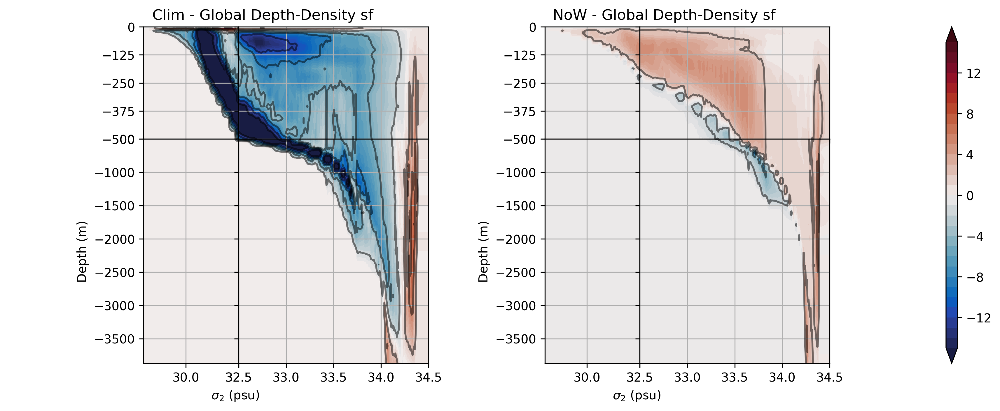

In [39]:
fig = plt.figure(figsize=(12,5), dpi=300)
gs = gridspec.GridSpec(1, 3, figure=fig, width_ratios=[1, 1, 0.04],  wspace=0.6, hspace=0.5)

for idx, key in enumerate(['Clim', 'NoW']):

    sig_limits = (28, 32.5,34.5)

    dd_sf_eul = datasets_ovr[key].dd_sf_eul.isel(Time=-1).cumsum('sigma2') * 1e-6
    dd_sf_bolus = datasets_ovr[key].dd_sf_bolus.isel(Time=-1).cumsum('sigma2') * 1e-6
    dd_sf_glob = dd_sf_eul + dd_sf_bolus

    contour = plot_axis_i(fig, gs, idx, dd_sf_glob, vm=8, title_i= key + ' - Global Depth-Density sf', sig_lims=sig_limits)



cax = fig.add_subplot(gs[2])  # Span the first two rows for temperature colorbar
fig.colorbar(contour_up, cax=cax, orientation='vertical')

plt.tight_layout()
path_to_plot = f"/home/x_titmo/work/analysis/NeverWorld2/plots/report/"
plt.savefig(path_to_plot  + f'example_Depth_Density_sf_Clim_NoW.png', bbox_inches='tight')
plt.show()